In [5]:
#node class
# i got very confused-- after changing python version, the word "size" seems to raise an issue-- but changing it to "Size" seems to resolve the issue 
import random
import matplotlib.pyplot as plt
from anytree import Node, RenderTree
from anytree import NodeMixin, RenderTree
from anytree import AsciiStyle, PreOrderIter, LevelOrderGroupIter
import graphviz
from anytree.exporter import DotExporter

import numpy as np
#treenode object 
class MarkoffNode( NodeMixin):  # Add Node feature # operation is name
     def __init__(self, data1,data2, data3 ,level, parent=None, children=None, name = 'None', Size = -1): #data = number at the node
        # self.name = name
         super(MarkoffNode, self).__init__()
         self.data1 = data1
         self.data2 = data2
         self.data3 = data3
         self.level = level
         self.name = name  #operations class of operations? 
         self.parent = parent
         self.Size = max(self.data1, self.data2, self.data3)
         if children:
             self.children = children
#tests
A = MarkoffNode(1,1,1,1, name = "12345")  
B = MarkoffNode(2, 2, 2,2, parent = A)
print (A.children)
print(B.parent.name)

(a, b, c) = (A.data1, A.data2, A.data3)
print (a)
print( a + b+ c)
udo = Node("Udo")
marc = Node("Udo", parent=udo)
lian = Node("Lian", parent=marc)
dan = Node("Dan", parent=udo)
jet = Node("Jet", parent=dan)
jan = Node("Jan", parent=dan)
joe = Node("Joe", parent=dan)

print(udo)
print (udo.children[0].name)                

                 
        
        
      
        
        
        
        
        
        
        
        
        
        



(<__main__.MarkoffNode object at 0x10d7ea4a0>,)
12345
1
3
Node('/Udo')
Udo


In [6]:
#functions of different generations of trees 
#R1, R2, R3 
def R1 (x1, x2, x3): 
    return (3*x2*x3-x1, x2, x3)
def R2 (x1, x2, x3): 
    return (x1, 3*x1*x3-x2, x3)
def R3 (x1, x2, x3): 
    return (x1, x2, 3*x1*x2-x3)
print(R1(1, 1, 1))
print(R2(1, 1, 1))
print(R3(1, 1, 1))

#sig1, 2, 3 
def sig12(x1, x2, x3): 
    return (x2, x1, x3) 
def sig13(x1, x2,x3): 
    return (x3, x2, x1)
def sig23(x1, x2, x3): 
    return (x1, x3, x2)
#rot1, rot2, rot3, 
def rot1 (x1, x2, x3): 
    return(sig23(R2(x1, x2, x3)))
def rot2(x1, x2,x3): 
    return(sig13(R2(x1, x2, x3)))
def rot3(x1, x2, x3) : 
    return ( sig12(R1(x1, x2, x3)))


#test 
root = MarkoffNode(1, 1, 1,1)
print(R1(root.data1, root.data2, root.data3))

A = MarkoffNode(1,1,1,1, name = "12345")  
B = MarkoffNode(2, 2, 2,2, A)
print (A.children[0].name)




(2, 1, 1)
(1, 2, 1)
(1, 1, 2)
(2, 1, 1)
None


In [7]:
#test function
def testTree(N):
    RNode = MarkoffNode(1, 1, 1,1 )
    print(RNode.children)
    for i in range(N-2): 
        print(i)
        RNode #placeholder
        childrenList = []
        for currNode in PreOrderIter(RNode): 
            if currNode.children == (): 
                childrenList += [currNode]
                
        for child in childrenList: 
            child.children += (MarkoffNode(i, 1, 1, i, name = "R1"),)
                 
        
    return RNode
#T1 = testTree(3)
#print(T1.children[0].children[0].children[0].children)


In [8]:
#code
#given depth N, create tree 
#optimization: get rid of nodes with identical numbers
def involutionTree(N): 
    #initialize tree 
    #root node
    RNode = MarkoffNode(1,1, 1,1)
    for i in range (N-1):
        childrenList = []
        for currNode in PreOrderIter(RNode): #iterating
            if currNode.children== (): 
                childrenList += [currNode] 
                
        for child in childrenList:
            
            
            (c1, c2, c3) = (child.data1, child.data2, child.data3)
            #applying R1:
            (x11, x21, x31) = R1(c1, c2, c3)
            #add node via R1:
            child.children += (MarkoffNode(x11,x21, x31, i+ 2, name = "R1"),)
            #apply R2:
            (x12, x22, x32) = R2(c1, c2, c3)
            #add node
            if not ( x12 == x11 and x22 == x21 and x32== x31):
                child.children += (MarkoffNode(x12,x22, x32, i+ 2, name = "R2"),)
            #applyR3: 
            (x13, x23, x33) = R3(c1, c2, c3)
            #add node
            
            if not (( x13 == x11 and x23 == x21 and x33== x31) and (x13 == x12 and x23 ==x22 and x33 == x32)):
                child.children += (MarkoffNode(x13,x23, x33, i+ 2, name = "R3"),)
            
            #applying R1:
         #   (x1, x2, x3) = R1(child.data1, child.data2, child.data3)
            #add node via R1:
          #  child.children += (MarkoffNode(x1,x2, x3, i+ 2, name = "R1"),)
            #apply R2:
          #  (x1, x2, x3) = R2(child.data1, child.data2, child.data3)
            #add node
         #   child.children += (MarkoffNode(x1,x2, x3, i+ 2, name = "R2"),)
            #applyR3: 
          #  (x1, x2, x3) = R3(child.data1, child.data2, child.data3)
            #add node
           # child.children += (MarkoffNode(x1,x2, x3, i+ 2, name = "R3"),)
    return RNode

#BGS 

def BGSTree(N): 
    #initialize tree 
    #root node
    RNode = MarkoffNode(1,1, 1,1)
    if N == 1: 
        return RNode
    RNode.children+= (MarkoffNode(1, 1, 2, 2, name = 'roti'),)
    if N == 2: 
        return RNode
    for i in range (N-2):
        childrenList = []
        for currNode in PreOrderIter(RNode): #iterating
            if currNode.children== (): 
                childrenList += [currNode] 
                
        for child in childrenList:
            (c1, c2, c3) = (child.data1, child.data2, child.data3)
            #applying R1:
            (x11, x21, x31) = (c1, c3, 3*c1*c3-c2)
            #add node via R1:
            child.children += (MarkoffNode(x11,x21, x31, i+ 3, name = "rot1"),)
            #apply R2:
            (x12, x22, x32) = (c3, c2, 3*c2*c3-c1)
            #add node
            if not ( x12 == x11 and x22 == x21 and x32== x31):
                child.children += (MarkoffNode(x12,x22, x32, i+ 3, name = "rot2"),)
            #applyR3: 
            (x13, x23, x33) = (c2, 3*c2*c3-c1, c3)
            #add node
            
            if not (( x13 == x11 and x23 == x21 and x33== x31) or (x13 == x12 and x23 ==x22 and x33 == x32)):
                child.children += (MarkoffNode(x13,x23, x33, i+ 3, name = "rot3"),)
    return RNode



#G/B

    
def ZagierTree(N): 
    #initialize tree 
    #root node
    RNode = MarkoffNode(1,1, 1,1)
    for i in range (N-1):
        childrenList = []
        for currNode in PreOrderIter(RNode): #iterating
            if currNode.children== (): 
                childrenList += [currNode] 
                
        for child in childrenList:
            #applying G:
            (x1, x2, x3) = (child.data1, child.data2, child.data3) 
            (q11, q22, q33) = (x1, x3, 3*x1*x3-x2)
            #add node via G:
            child.children += (MarkoffNode(q11, q22, q33, i+ 2, name = "G"),)
            #apply B:
            (q1, q2, q3) = (x2, x3, 3*x2*x3-x1)
        
            #add node 
            if not (q11== q1 and q22 == q2 and q33 ==q3 ):
                child.children += (MarkoffNode(q1, q2, q3, i+ 2, name = "B"),)
    return RNode

#rotations
            

In [9]:
#test
T1 = BGSTree(6)
T2 = ZagierTree(5)
T3 = involutionTree(5)
#print(T1.children[0].data1)
#DotExporter(T1).to_picture("1") tried to produce png but failed 

In [10]:

for pre, fill, node in RenderTree(T1):
     print("%s%s" % (pre, (node.data1,node.data2, node.data3, node.Size,node.level, node.name)))
        

#alternate way of drawing that I haven't figured out how to make it work
#DotExporter(udo).to_picture("udo.png")



(1, 1, 1, 1, 1, 'None')
└── (1, 1, 2, 2, 2, 'roti')
    ├── (1, 2, 5, 5, 3, 'rot1')
    │   ├── (1, 5, 13, 13, 4, 'rot1')
    │   │   ├── (1, 13, 34, 34, 5, 'rot1')
    │   │   │   ├── (1, 34, 89, 89, 6, 'rot1')
    │   │   │   ├── (34, 13, 1325, 1325, 6, 'rot2')
    │   │   │   └── (13, 1325, 34, 1325, 6, 'rot3')
    │   │   ├── (13, 5, 194, 194, 5, 'rot2')
    │   │   │   ├── (13, 194, 7561, 7561, 6, 'rot1')
    │   │   │   ├── (194, 5, 2897, 2897, 6, 'rot2')
    │   │   │   └── (5, 2897, 194, 2897, 6, 'rot3')
    │   │   └── (5, 194, 13, 194, 5, 'rot3')
    │   │       ├── (5, 13, 1, 13, 6, 'rot1')
    │   │       ├── (13, 194, 7561, 7561, 6, 'rot2')
    │   │       └── (194, 7561, 13, 7561, 6, 'rot3')
    │   ├── (5, 2, 29, 29, 4, 'rot2')
    │   │   ├── (5, 29, 433, 433, 5, 'rot1')
    │   │   │   ├── (5, 433, 6466, 6466, 6, 'rot1')
    │   │   │   ├── (433, 29, 37666, 37666, 6, 'rot2')
    │   │   │   └── (29, 37666, 433, 37666, 6, 'rot3')
    │   │   ├── (29, 2, 169, 169, 5, 'ro

In [7]:
for pre, fill, node in RenderTree(T2):
     print("%s%s" % (pre, (node.data1,node.data2, node.data3, node.level)))
        


(1, 1, 1, 1)
└── (1, 1, 2, 2)
    └── (1, 2, 5, 3)
        ├── (1, 5, 13, 4)
        │   ├── (1, 13, 34, 5)
        │   └── (5, 13, 194, 5)
        └── (2, 5, 29, 4)
            ├── (2, 29, 169, 5)
            └── (5, 29, 433, 5)


In [8]:
for pre, fill, node in RenderTree(T3):
     print("%s%s" % (pre, (node.data1,node.data2, node.data3, node.level)))

(1, 1, 1, 1)
├── (2, 1, 1, 2)
│   ├── (1, 1, 1, 3)
│   │   ├── (2, 1, 1, 4)
│   │   │   ├── (1, 1, 1, 5)
│   │   │   ├── (2, 5, 1, 5)
│   │   │   └── (2, 1, 5, 5)
│   │   ├── (1, 2, 1, 4)
│   │   │   ├── (5, 2, 1, 5)
│   │   │   ├── (1, 1, 1, 5)
│   │   │   └── (1, 2, 5, 5)
│   │   └── (1, 1, 2, 4)
│   │       ├── (5, 1, 2, 5)
│   │       ├── (1, 5, 2, 5)
│   │       └── (1, 1, 1, 5)
│   ├── (2, 5, 1, 3)
│   │   ├── (13, 5, 1, 4)
│   │   │   ├── (2, 5, 1, 5)
│   │   │   ├── (13, 34, 1, 5)
│   │   │   └── (13, 5, 194, 5)
│   │   ├── (2, 1, 1, 4)
│   │   │   ├── (1, 1, 1, 5)
│   │   │   ├── (2, 5, 1, 5)
│   │   │   └── (2, 1, 5, 5)
│   │   └── (2, 5, 29, 4)
│   │       ├── (433, 5, 29, 5)
│   │       ├── (2, 169, 29, 5)
│   │       └── (2, 5, 1, 5)
│   └── (2, 1, 5, 3)
│       ├── (13, 1, 5, 4)
│       │   ├── (2, 1, 5, 5)
│       │   ├── (13, 194, 5, 5)
│       │   └── (13, 1, 34, 5)
│       ├── (2, 29, 5, 4)
│       │   ├── (433, 29, 5, 5)
│       │   ├── (2, 1, 5, 5)
│       │   └── (

In [11]:
# tasks: 1. other ways to genarate markoff triples. 2. graph the distribution of triples 
#ways to graph: 1.size at each level(largest and smallest), 2.distribution of sizes at each level

#1. 
#find largest size and smallest size at each level-returns nestedarray. 
#List of sizes WRT level 

#returns returns nested array WRT level of the nodes
def findSize(N, i): # i represents which type of construction we would like
    T = BGSTree(N)
    if i == 1 : 
        T = ZagierTree(N)
    if i == 2 : 
        T = involutionTree(N)
    #iterate
    sizeList = [[node.Size for node in children] for children in LevelOrderGroupIter(T)]
    return sizeList
print(findSize(3, 0))


def findTriple(N, i): # i represents which type of construction we would like
    T = BGSTree(N)
    if i == 1 : 
        T = ZagierTree(N)
    if i == 2 : 
        T = involutionTree(N)
    #iterate
    sizeList = [[(node.data1, node.data2, node.data3) for node in children] for children in LevelOrderGroupIter(T)]
    return sizeList
#test
print (findTriple(3, 0)  )  


#visualize: 
#find max and min at each level: 
def plotMaxMin(N, i): 
    #0: BGS, 1: Zagier 2:involution
    sizeList = findSize(N, i)
    maxList = [max(node) for node in sizeList]
    print( maxList)
    minList = [min(node) for node in sizeList]
    print (sizeList)
    print(minList)
    index = [p for p in range(N)]
    print( index)
    plt.plot(index, maxList, 'r--', index, minList, 'bs')
    plt.show()

#plotMaxMin( 8, 0)

def plotMultipleMax (N): 
    sizeListBGS = findSize(N, 0)
    sizeListZagier = findSize(N, 1)
    sizeListInvolution = findSize(N, 2)
    
    maxListBGS = [max(node) for node in sizeListBGS]
    maxListZag = [max(node) for node in sizeListZagier]
    maxListInv = [max(node) for node in sizeListInvolution]
    index = [p for p in range(N)]
    plt.plot(index, maxListBGS, 'r--', index, maxListZag, 'bs', index,maxListInv, 'g^')
    plt.show()

    
#plotMultipleMax( 4)


[[1], [2], [5, 5, 5]]
[[(1, 1, 1)], [(1, 1, 2)], [(1, 2, 5), (2, 1, 5), (1, 5, 2)]]


## plot log_3 sizes at a given level 

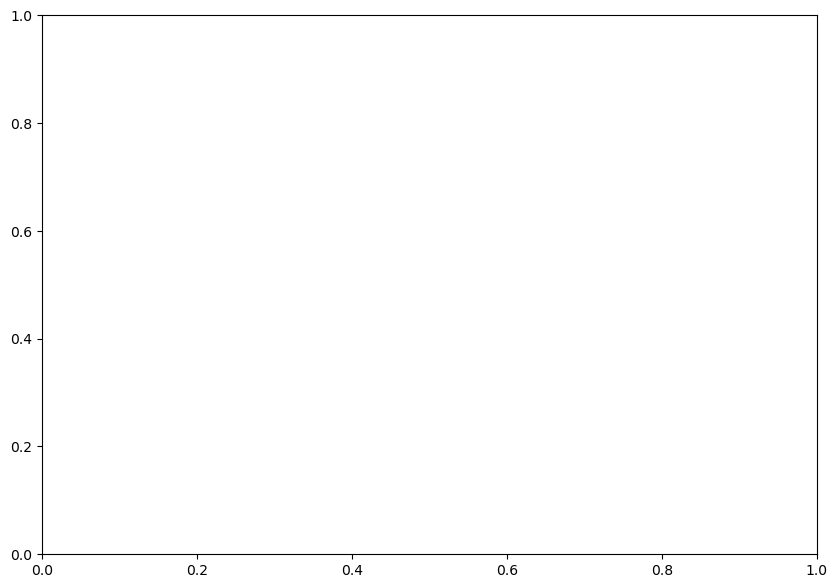

In [12]:
# Creating dataset
#i values-- 0: BGS  1: Zagier 2: involution 
import math
#function 
def plotDistLog (N, i): 
    sizes = findSize(N, i)
   # print (sizes)
    flatSizeOri = sizes[N-1] 
 #   print (len(flatSizeOri))
    flatSize =[(int)(math.log(a,3)) for a in flatSizeOri ]
    
    maxSize = max([z for cell in sizes for z in cell ]) # find max size to set x axis 
   # print (maxSize)
   # print(max(flatSize))
    steSize = int(max(flatSize)/5)
    xais = [steSize*i for i in range(7)]
    
    n, bins, patches = plt.hist(x=flatSize, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)
    Name = 'BGS'
    if i == 1 : 
        Name = 'Zagier'
    if i == 2: 
        Name = 'involution'
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('distribution of log_3 sizes for ' + Name + ' tree of height ' + str(N))

    maxfreq = n.max()
    print(maxfreq)
    # Set a clean upper y-axis limit.
    plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)
fig, ax = plt.subplots(figsize =(10, 7))
    
# print(xaxis)
#plotDistLog( 8, 0)
#plotDistLog( 12, 1)
#plotDistLog( 15, 1)
#plotDistLog(13, 0)
#plotDistLog(8, 0)
#plotDistLog(10, 0)
#plotDistLog(13, 0)

#plotDistLog(8, 2)
#plotDistLog(10, 2)
#plotDistLog(13, 2)
#plotDistLog(14, 2)
#plotDist(15, 0)


#changes to code: BGS algo,

#12 is the largest num for the graph to be generated within less than a minute, 13 takes a long time but doable
# 14 takes more time( a bit too long )

In [11]:
#plotDistLog(14, 0)

In [12]:
#plotDistLog(13, 0)

In [13]:
print(math.log(1234134513562463256726424623546234562345234532452511534632626523562345625272, 3))

157.38423253015202


In [14]:
3**(184.6309)

1.2340327000680495e+88

873.0


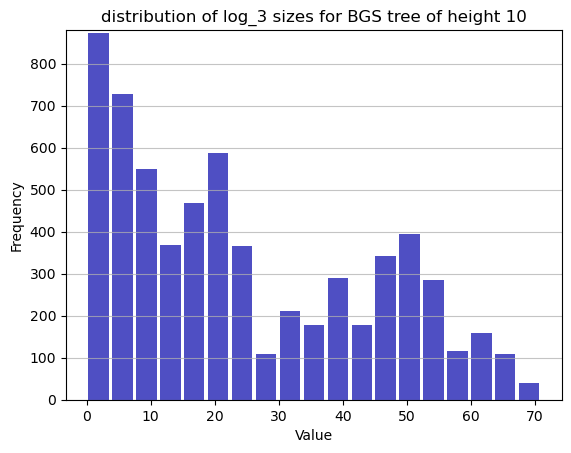

In [15]:
plotDistLog(10, 0)

311.0


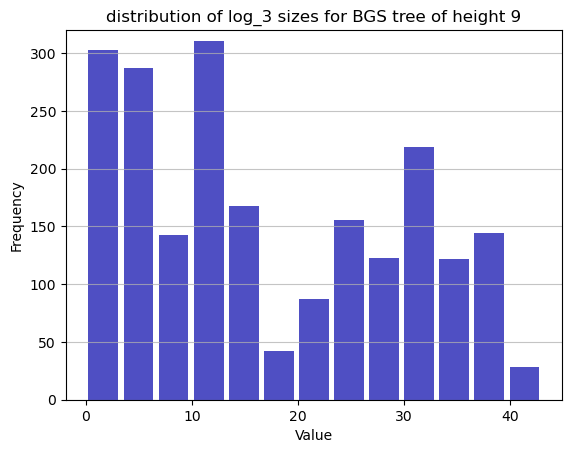

In [16]:
plotDistLog(9, 0)

100.0


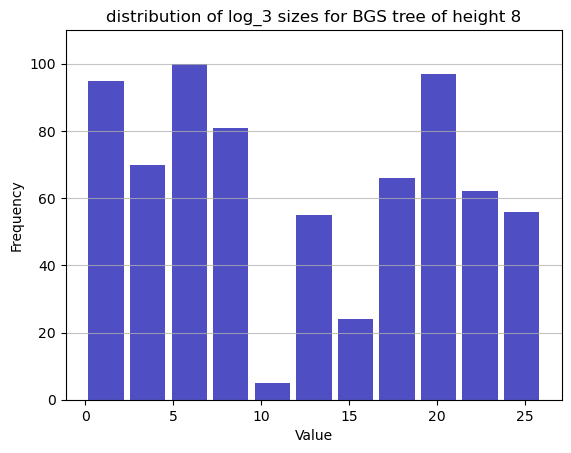

In [17]:
plotDistLog(8, 0)

In [18]:
# involution tree

In [19]:
#plotDistLog(13, 2)

In [20]:
#plotDistLog(12, 2)#

In [21]:
#plotDistLog(10, 2)

In [22]:
#plotDistLog(9, 2)

In [23]:
#plotDistLog(7, 2)

In [4]:
plotDistLog(14, 1)

NameError: name 'plotDistLog' is not defined

In [25]:
plotDistLog(12, 1)

40.0


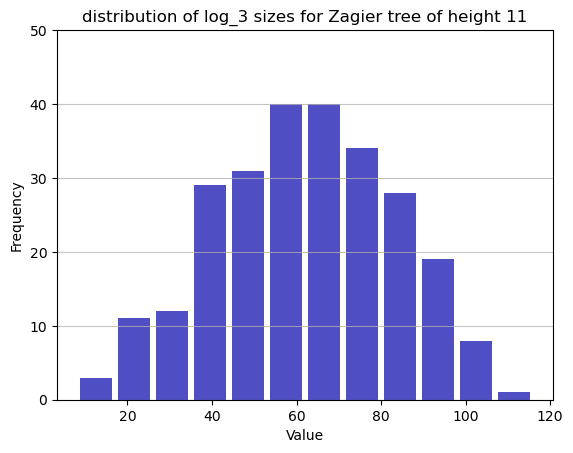

In [26]:
plotDistLog(11, 1)

14.0


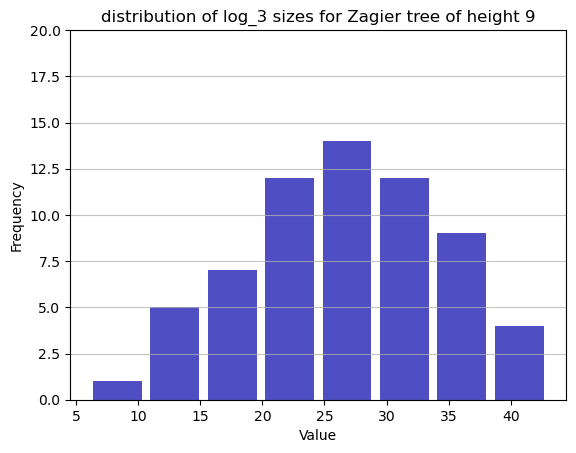

In [27]:
plotDistLog(9, 1)

In [28]:
#plotDistLog(7, 1)

In [13]:
# run into the finite number issue-- try to truncate the numbers --- try to graph 75% of the numbers 
# problem with the percentile function while the level gets large, so changed the method to randomly find a entry from the list
def truncatePlotDist (N, i, percentile):
    sizes = findSize(N, i) 
    flatSize = sizes[N-1] 
    
    maxSize = max([z for cell in sizes for z in cell ]) # find max size to set x axis 
    
  #  per = np.percentile(flatSize, percentile)
    per = random.choice( flatSize)
    
    gph = []
    for k in flatSize: 
        if k <= per: 
            gph += [k]
    print(max(gph))
    steSize = int(max(gph)/20)
    xais = [steSize*i for i in range(22)]
    n, bins, patches = plt.hist(x=gph, bins=xais, color='#0504aa',
                            alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('distribution of sizes at level ' + str(N) + 'and random size' + str(per) )

    maxfreq = n.max()
    # Set a clean upper y-axis limit.
    plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)
    
    

#fig, ax = plt.subplots(figsize =(10, 7))
#truncatePlotDist (14, 0, 50)
#PERCENTILE VERSION
# conclusion: at % 75, max level = 9, 60%: 11

#RANDOMLY CHOOSE A NUMBER VERSION
# it seems that its the percentile function that doesnt work well --- use random number generator to get a smaller subset 
# 

8


## graph distribution of sizes at given level 

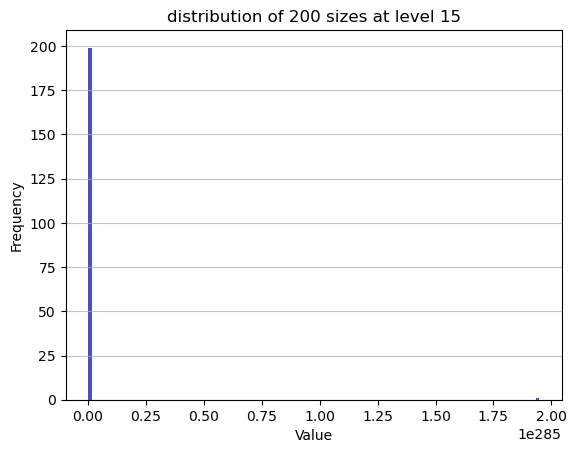

In [14]:
#task1: 

#randomly select paths to generate graph L: level, N: number of points generated
def Rot1 (c1, c2, c3): 
    return [c1, c3, 3*c1*c3-c2]

def Rot2 (c1, c2, c3): 
    return [c3, c2, 3*c2*c3-c1]

    
def Rot3 (c1, c2, c3): 
    return [c2, 3*c2*c3-c1, c3]
    
#important: start with level 2 with markoff triple (1, 1, 2)
def randomPathBGS(L, N): 
    start = [1, 1, 2]
    returnList = []
    for i in range(N): 
        for o in range( L-2): 
           
            rand = random.randint(0,2)
        #    print(rand)
            if(rand == 0): 
                start = Rot1(start[0], start[1],start[2])
            if(rand ==1 ): 
                start = Rot2(start[0], start[1],start[2])
            if ( rand == 2): 
                start = Rot3(start[0], start[1],start[2])
        returnList += [start]
        
        start = [1, 1, 2]
      #  print ("start:"+ str(start))
    return returnList    
    
#print (randomPathBGS(5, 5))              
        
def graphRandomBGS(L, N): 
    tripleList = randomPathBGS(L, N)
    randomMax = [max(element) for element in tripleList] 
    stepSize = (max(randomMax) // 100)
    
 #   stepSize = (int)(np.floor_divide(randomMax,100))
    xais = [i * stepSize for i in range ( 102) ]
    
    #graph 
    n, bins, patches = plt.hist(x=randomMax, bins=xais, color='#0504aa',
                            alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('distribution of '+str(N)+' sizes at level ' + str(L)  )
#at level 16, the program will almost always run into integer division too large--> use // instead of / --> integer too large to convert to float
### *** USE DECIMAL PACKAGE TO BE ABLE TO USE LARGE INTS
graphRandomBGS(15, 200)    

## graph markoff mod p functions 


In [17]:
#week 2 task 2 
#TODO: make the graph pretter -- find some pattern in the graph that makes the visualization prettier
import networkx as nx

#todo: figure out a way to label the edges, ask what attributes are needed
def returnMod (List,  p): 
    return [a%p for a in List]
def combineNum( a, b, c): 
    sort1 = [a, b, c]
    sort1.sort()
    return int (str(sort1[0]) + '000' + str(sort1[1]) +'000'+ str(sort1[2]))

def combineNumUno(a, b, c): 
    sort1 = [a, b, c]
   
    return int (str(sort1[0]) +'000' + str(sort1[1])+ '000' + str(sort1[2]))

def combineUnord (a, b, c, p): 
    (d, e, f) = returnMod ([a, b, c], p)
    return combineNumUno(d, e, f)











    
# the order doesn't matter version

def graphmodPLev (L, p): #L: level, P: prime mod -BGS note: the construction assumes p < 10 -- needs new cobineNume if p>=10
    #generate edge set
    edgeList = []
    T = BGSTree(L) 
    #iterate through the triples
   # sizeList = [[(node.data1, node.data2, node.data3, ) for node in children] for children in LevelOrderGroupIter(T)]
 #   flat = [node in C for C in LevelOrderGroupIter ]
    for Node in LevelOrderGroupIter(T):
        for ND in Node: 
            childrenTripleList = []
            modList = returnMod((ND.data1, ND.data2, ND.data3), p)
            A = combineNum(modList[0], modList[1], modList[2])
            for child in ND.children: 
              #  unModed = te
                secModList = returnMod((child.data1, child.data2, child.data3), p)
                B = combineNum(secModList[0], secModList[1], secModList[2])
                edgeList+= [(A, B)]
                print (edgeList)
    #graph: 
    G = nx.DiGraph()
    G = nx.MultiDiGraph()
    G.add_edges_from(edgeList)
  
    plt.figure(figsize =(9, 9))
    nx.draw_networkx(G,  node_color ='green')
    
#graphmodP (4, 7)            
        
# the order matters version: 


def graphmodPunord (L, p): #L: level, P: prime mod -BGS note: the construction assumes p < 10 -- needs new cobineNume if p>=10
    #generate edge set
    edgeList = []
    T = BGSTree(L) 
    for Node in LevelOrderGroupIter(T):
        for ND in Node: 
            childrenTripleList = []
            modList = returnMod((ND.data1, ND.data2, ND.data3), p)
            A = combineNumUno(modList[0], modList[1], modList[2])
            for child in ND.children: 
              #  unModed = te
                secModList = returnMod((child.data1, child.data2, child.data3), p)
                B = combineNumUno(secModList[0], secModList[1], secModList[2])
                edgeList+= [(A, B)]
                print (edgeList)
    #graph: 
    G = nx.DiGraph()
    G = nx.MultiDiGraph()
    G.add_edges_from(edgeList)
    size = int(G.number_of_nodes())
  
    plt.figure(figsize =(9, 9))
    nx.draw_networkx(G,  node_color ='green')
    
    
#stop when the node list is large enough
def graphmodP1 ( p): #L: level, P: prime mod -BGS 
    #generate edge set
    edgeList = []
    size = 0
    expectedSize = 0 
    L = 0
    if p % 4 == 1: 
        expectedSize = p*p+3*p
    else: 
        expectedSize = p*p- 3*p
        
        
    G = nx.DiGraph()
    G = nx.MultiDiGraph()
    G.add_edges_from(edgeList)
    size = int(G.number_of_nodes())
    
        
    while not( expectedSize== size ):
       # L +=1
        T = BGSTree(L+2) 
       # TExact = BGSTree(L)
        Parent = []
        for X in PreOrderIter(T): 
            if X.level ==L: 
                Parent+= [X]
                
        ParentDataList = [combineUnord( children.data1, children.data2, children.data3, p) for children in Parent]

        for Par in Parent: 
            ParNode = combineUnord(Par.data1, Par.data2, Par.data3, p)
            for ch in Par.children: 
                chilNode = combineUnord(ch.data1, ch.data2, ch.data3, p)
                G.add_edge(ParNode, chilNode )
           #     print("added edge")
               
        
        size = int(G.number_of_nodes())
        print( size)
        L+=1
  
    plt.figure(figsize =(9, 9))
    nx.draw_networkx(G,  node_color ='green')
    return L +1
    
    
    


    
    
#graphmodP1 (7)            

#graphmodPunord (5, 7)

# graph mod tripe w

# check if a triple is markoff triple
def checkMarkoff (List, p): 
    x1 = List[0]
    x2 = List [1]
    x3 = List [2]
    root1 =(x1**2 + x2**2 + x3**2 ) 
    root2 =   3*(x1 * x2 * x3)
    root = (root1 - root2 ) %p
    if root == 0: 
        return 1 
    return  0

def findTriples (p): 
    #start with finding all markoff mod p triples
    allTriples = [] 
    for a in range (p): 
        for b in range ( p): 
            for c in range (p): 
                if (not ((a, b, c) == (0, 0,0) )) and(checkMarkoff([a, b, c], p) == 1): 
                    allTriples+= [[a, b, c]]
  #  print (allTriples)
    return allTriples


def graphModp2 (p): 
    allTriple = findTriples (p)
    G = nx.DiGraph()
    G = nx.MultiDiGraph()
    for [a, b, c] in allTriple: 
        [d, e, f] = [Rot1(a, b, c), Rot2(a, b, c), Rot3(a, b, c)]
      #  newEdge1 = [combineUnord(a, b, c), combineUnord(d)]
        G.add_edge(combineUnord(a, b, c, p), combineUnord(d[0], d[1], d[2], p) )
        G.add_edge(combineUnord(a, b, c, p), combineUnord(e[0], e[1], e[2], p) )
        G.add_edge(combineUnord(a, b, c, p), combineUnord(f[0], f[1], f[2], p) )
  #  plt.figure(figsize =(9, 9))
  #  nx.draw_networkx(G,  node_color ='green')
    return G
    
    
#graphModp2(7)

#G.nodes['262']['color'] = 'red'

print(len(findTriples(13)))
    




    

208


In [18]:
##note-- values of graph 
# getting various graph properties
print("Total number of nodes: ", int(G.number_of_nodes()))
print("Total number of edges: ", int(G.number_of_edges()))
print("List of all nodes: ", list(G.nodes()))
print("List of all edges: ", list(G.edges(data = True)))
print("Degree for all nodes: ", dict(G.degree()))
print("Total number of self-loops: ", int(G.number_of_selfloops()))
print("List of all nodes with self-loops: ", list(G.nodes_with_selfloops()))
print("List of all nodes we can go to in a single step from node E: ",
                                               list(G.neighbors('E")))

SyntaxError: unterminated string literal (detected at line 11) (166893264.py, line 11)

## check if a point appears at the same level of different trees

In [20]:
#1. pick random points at each level and see if the different constructions give the same thin 
#2. mod p graphs -- directed graphs


#FIX THIS PART
def flatten(l):
    return [item for sublist in l for item in sublist]
#1
def findNum(A, B): 
    L = []
    for a in A: 
        if a not in B: 
            L += [a] 
    return L


# verifies if a set of n random sizes of points that appears at level L of the BGS tree appears at the same level of Zagier and involution tree. 
def verifySize  (n, L): #n: number of values chosen, L: level, verify by size
    T1 = BGSTree(L)
    T2 = ZagierTree(L)
    T3 = involutionTree(L)
    S1 = findSize(L, 0)
    S2 = findSize(L, 1)
    S3 = findSize(L, 2)
    #generate random number at level L for BGS
    levelListBGS = S1[L-1]
    levelListZag = S2[L-1]
  #  print(levelListZag) 
  #  print( levelListBGS)
  #  print(S1)
    levelListInv = S3[L-1]
    randNumBGS = [random.choice(levelListBGS) for i in range(n-1) ]
    #find if the numbers in the random list could be found in other lists
    N1 = findNum(randNumBGS, levelListZag)# checks if randNum BGS is in the same level of Zagier tree
    N2 = findNum(randNumBGS, levelListInv)#checks if randNumBGS is in the same level of involution tree 
    Nflatten1 = findNum(randNumBGS,flatten(S2) ) # check if list randNumBGS ever appears in L level Zagier Tree
    Nflatten2 = findNum(randNumBGS, flatten( S3)) # check if list randNumBGS ever appears in L level Involution tree
    return (N1, N2, Nflatten1, Nflatten2)
    

print( verify ( 5, 4))

def findTri(T, L): #T: a list of triples L: a list of triples
    List = []
    ind = 0
    for (a, b, c) in T : 
        for (d, e, f) in L: 
            A = [a, b, c]
            A.sort()
            B = [d, e, f]
            B.sort()
            if (A == B): 
                ind = 1
        if ind == 0:
            List += [A]
        ind = 0 
    return List
            

# choose a random set of n points from level L of the BGS tree and checks if the set of points appears at level L of zagier and involution tree/earlier on in the trees. 
def verifyDetail ( n, L):
    T1 = BGSTree(L)
    T2 = ZagierTree(L)
    T3 = involutionTree(L)
    S1 = findTriple(L, 0)
   # print(S1)
    S2 = findTriple(L, 1)
    S3 = findTriple(L, 2)
    tripleListBGS = S1[L-1]
    tripleListZag = S2[L-1]
   # print(S1[2])
    tripleListInv = S3[L-1]
   # print(S1)
   # print(S2)
   # print(S3)
    
    randTripleBGS = [random.choice(tripleListBGS) for i in range(n-1) ]
    
    N1 = findTri(randTripleBGS, tripleListZag)
  #  print("tripe list zag: ")
   # print(tripleListZag)
    
    N2 = findTri(randTripleBGS, tripleListInv)
  #  print("triple list")
 #   print(N2)
    Nflatten1 = findTri(randTripleBGS,flatten(S2) )
    Nflatten2 = findTri(randTripleBGS, flatten( S3))
    return (N1, N2, Nflatten1, Nflatten2)
    
print(verifyDetail  ( 10,3))

NameError: name 'verify' is not defined

In [102]:
print( (1, 1, 2) == (1, 1, 2))

True


In [107]:
findTri([(1, 1, 3), [2, 2, 2]], [[1, 1, 1], [2, 2, 3]])

[[1, 1, 3], [2, 2, 2]]

In [ ]:
print (2**1002)

In [108]:
print(verifyDetail  ( 50,10))

([[13, 34, 1325], [5, 433, 6466], [1, 5, 13], [1, 5, 13], [1, 1, 2], [1, 1, 2], [1, 34, 89], [13, 51641, 2012674], [985, 5741, 16964653], [6466, 8399329, 162930183509], [985, 5741, 16964653], [6466, 8399329, 162930183509], [34, 9077, 925765], [5, 433, 6466], [29, 169, 14701], [13, 194, 7561], [13, 194, 7561], [985, 499393, 1475706146], [985, 499393, 1475706146], [1, 34, 89], [5, 43261, 646018], [29, 169, 14701], [89, 9077, 2423525], [29, 433, 37666], [2, 5, 29], [1325, 51641, 205272962], [2, 5741, 33461], [2897, 1686049, 14653451665], [2, 5, 29], [13, 294685, 11485154], [2, 5741, 33461], [13, 194, 7561], [29, 433, 37666]], [], [], [])


## compute order and discriminant 

In [21]:
#check findorder -- new implementation of findorder
def findOrder( List,i, p): 
    x1 = List[0]
    x2 = List[1]
    x3 = List[2]
    L = [x1, x2, x3] 
    if i == 2: 
        for k in range ( (p+1)**2): 
            L = Rot3(L[0], L[1], L[2])
            L = L[0] %p, L[1]%p, L[2]%p
         #   print("L:")
         #   print(L)
         #   print("k:")
          # print( k)
            if (L[0] %p, L[1]%p, L[2]%p) == (x1 %p, x2%p, x3%p):
                
              #  print (L)
                return k +1
    if i == 1: 
        for k in range ( (p+1)**2): 
            L = Rot2(L[0], L[1], L[2])
            L = L[0] %p, L[1]%p, L[2]%p
         #   print("L:")
       #     print(L)
       #     print("k:")
       #     print( k)
            if (L[0] %p, L[1]%p, L[2]%p) == (x1 %p, x2%p, x3%p):
             #   print (L)
                return k +1
    if i == 0: 
        for k in range ( (p+1)**2): 
            L = Rot1(L[0], L[1], L[2])
            L = L[0] %p, L[1]%p, L[2]%p
          #  print("L:")
          #  print(L)
          #  print("k:")
         #   print( k)
            if (L[0] %p, L[1]%p, L[2]%p) == (x1 %p, x2%p, x3%p):
               # print (L)
                return k +1
        
    return -1

#def findOrder (List, i, p): 
  #  return computeRotOrder(List, i, p)

In [22]:
#week 3  tasks: 
#1. see if a markoff triple is in the cage
#2. send pdf
#3. graph % of markoff triples that is in the cage with respect to the prime
#4. highlight them in graphs
#import sage 
#from sage.arith.misc import kronecker

#from sage.all import *

#[[a,b], [c, d]]  = matrix([[0,1], [-1, 15]])**(6)
#print([a %7, b%7],[c%7, d%7])


#1st rotation order of 615


#def computeorder (p, (a, b, c)):


#1.compute order of a given triple 
#2. check if a given triple is in the cage 
#3. data --- percent of triples in the cage
#4. highlight points in the cage on the graph

# find order of markoff triple 




def findDiscriminant(List, i, p): 
  #  List = [a, b,c ]
    return ((9 * (List[i]**2) -4)) % p


#this implementation doesn't give the desired result for large primes
def findOrderMat (List, i, p ): 
    A = [[0,1], [-1, 3 * (List[i])]]
    M = [[0,1], [-1, 3 * (List[i])]] #np.dot([[0,1], [-1, 3 * (List[i])]], [List[1], List[2]]) #ch
    print (A)
    M0 = [[0,1], [-1, 3 * (List[i])]]
    for k in range (p**2+2): 
        
        
        [[B , C ], [D , E ]] = M
        [[B0 , C0 ], [D0 , E0 ]] = M0
        
        
       
        
        M0 = [[B0 % p, C0 % p],[D0 % p, E0 % p]]
        print ("M0:")
        print (M0)
        if (M0 == [[1, 0], [0,1]]): 
            return k+1
        
        
        M0 = np.dot (A, M0)
        print("k:")
        print( k)
        print("original mat: ")
        print ([[B , C ], [D , E ]])
        print("mod matrix")
        print([[B % p, C % p],[D % p, E % p]])
        
        if ([[B % p ,C% p ], [D% p , E% p]] == [[1, 0], [0,1]]):
            return k +1
        M  =  np.dot(A, M)
    return (-1)





# control group
def findOrderMatCont (List, i, p ): 
    A = [[0,1], [-1, 3 * (List[i])]]
    M = [[0,1], [-1, 3 * (List[i])]] #np.dot([[0,1], [-1, 3 * (List[i])]], [List[1], List[2]]) #ch
    print (A)
    for k in range (p**2+2): 
        
        
        [[B , C ], [D , E ]] = M
        M = [[B % p, C % p],[D % p, E % p]]
        print("k:")
        print( k)
        print("original mat: ")
        print ([[B , C ], [D , E ]])
        print("mod matrix")
        print([[B % p, C % p],[D % p, E % p]])
        
        if ([[B % p ,C% p ], [D% p , E% p]] == [[1, 0], [0,1]]):
            return k +1
        M  =  np.dot(A, M)
    return (-1)







            
 # check if the ith coordinate is maximal           
def checki ( List, i, p): 
    D = findDiscriminant(List, i, p)
    #check if discriminant is 0 
    O = findOrder (List, i, p)
   # print ('order:' + str (O))
    #parabolic
    if D == 0 and (O == p or O == 2*p):
 #       print('parabolic')
        return 1 
    #elliptic and hyperbolic
    if (O == p-1 or O == p+1) and not (D == 0): 
 #       print('ellip or hyperb')
        return 1
    return 0 

#print (findDiscriminant ([1, 2, 5], 0, 7))
#print(findOrder([1, 2, 5], 0, 7))
#print (checki ([1, 2, 5], 2, 7))
        


In [23]:


print(findOrderMat([1, 2, 5], 2, 23))

print(findOrder([1, 2, 5], 2, 23))

 

[[0, 1], [-1, 15]]
M0:
[[0, 1], [22, 15]]
k:
0
original mat: 
[[0, 1], [-1, 15]]
mod matrix
[[0, 1], [22, 15]]
M0:
[[22, 15], [8, 17]]
k:
1
original mat: 
[[-1, 15], [-15, 224]]
mod matrix
[[22, 15], [8, 17]]
M0:
[[8, 17], [6, 10]]
k:
2
original mat: 
[[-15, 224], [-224, 3345]]
mod matrix
[[8, 17], [6, 10]]
M0:
[[6, 10], [13, 18]]
k:
3
original mat: 
[[-224, 3345], [-3345, 49951]]
mod matrix
[[6, 10], [13, 18]]
M0:
[[13, 18], [5, 7]]
k:
4
original mat: 
[[-3345, 49951], [-49951, 745920]]
mod matrix
[[13, 18], [5, 7]]
M0:
[[5, 7], [16, 18]]
k:
5
original mat: 
[[-49951, 745920], [-745920, 11138849]]
mod matrix
[[5, 7], [16, 18]]
M0:
[[16, 18], [5, 10]]
k:
6
original mat: 
[[-745920, 11138849], [-11138849, 166336815]]
mod matrix
[[16, 18], [5, 10]]
M0:
[[5, 10], [13, 17]]
k:
7
original mat: 
[[-11138849, 166336815], [-166336815, 2483913376]]
mod matrix
[[5, 10], [13, 17]]
M0:
[[13, 17], [6, 15]]
k:
8
original mat: 
[[-166336815, 2483913376], [-2483913376, 37092363825]]
mod matrix
[[13, 1

In [ ]:
#print(np.dot([[-27543862067299424, 411313439034311505], [-411313439034311505, 6142157723447373151]], [[0,1],[-1, 15]]))
B = [[ -411313439034311505, 6142157723447373151],
 [-6142157723447373151,  -512667955871472320]]
C = [ -411313439034311505,  6142157723447373151,
 -6142157723447373151]

C = [6142157723447373151, -113178304499112652914054085807672694898, -6142157723447373151]
print(Rot3(C[0], C[1], C[2]))

#print(np.dot([[-27543862067299424, 411313439034311505], [-411313439034311505, 6142157723447373151]], B))

## check if a point is in the cage/sqrt

In [24]:
# find all the markoff triples n the cage given a prime p 
def checkSqrtp ( List, p ): 
    t = np.sqrt( p )
    if findOrder (List, 0, p) >= t or findOrder (List, 1, p) >= t or findOrder (List, 2, p) >= t : 
        return 1
    return 0

# version 0: if for any i, x_i's order is maximal
def checkCageOri ( List, p): 
    if (checki(List, 0, p) >0) or (checki(List, 1, p)>0) or (checki(List, 0, p)>0): 
        return 1 
    return 0 

#find maximum order for all i and return the corresponding i 
def findMaxOrd(List, p): 
    ordList = [findOrder(List, 0, p), findOrder(List, 1, p), findOrder( List, 2, p)]
   
    maxOrder = max(ordList)
  # print ("maxorder:")
   # print( maxOrder)
    indexList= []
    for i in range (3): 
        if (ordList [i] == maxOrder): 
            indexList += [i]
  #  print ("indexList")
  #  print (indexList)
    return indexList
        
        
    
    
#version 1: for the maximum order, check if the corresponding order is maximal wrt to discriminant
def checkCage(List, p): 
    for i in findMaxOrd(List, p): 
        #find the maximum order of all i's, and check for separate i 
        if (checki ( List, i, p)>0): 
            return i
    return -1
    
    
    
#check square
#check if point is in cage, if it is in cage, return its type (parab, hyper, ellip)
    

def findSqrt(p): 
    allTriple = findTriples (p) 
    sqrt = []
    for List in allTriple: 
        if checkSqrtp(List, p) == 1: 
            sqrt +=   [List]
 #   print (sqrt)
    return sqrt
    
    
    
def findCage (p): 
    allTriple = findTriples (p) 
    cage = []
    for List in allTriple: 
        if checkCage(List, p) >=0: 
            cage +=   [List]
   # print ("number of total points:" + str(len(allTriple)))
 #   print ("number of points in cage:" + str(len(cage)))
    return cage


# find cage wrt to the old definition ( as long as the order = 2, p-1, p+1 in the correct situation for some x_i)
def findCageOri (p): 
    allTriple = findTriples (p) 
    cage = []
    for List in allTriple: 
        if checkCageOri(List, p) >= 0: 
            cage +=   [List]
    return cage
#print(findCage (7))





In [59]:
print (computeRotOrder( [1, 2, 5], 2, 23))
print (findOrder([1, 2, 5], 2, 23))
print (findDiscriminant([1, 2, 5], 2, 23))
print ( Rot1(1, 2, 5))
A = [[0,1],[-1, 3]]
M = A
print( np.dot(A, [2, 5]))
for i in range (23): 
    A = np.dot (A, M)
print (A)
print (np.dot (A, [2, 5]))
print (findMaxOrd([1, 2, 5], 23))

24
24
14
[1, 5, 13]
[ 5 13]
[[-1836311903  4807526976]
 [-4807526976 12586269025]]
[20365011074 53316291173]
[0, 2]


In [18]:
# plot percentage of cage at each prime


In [25]:
# graph vertex in cage with another color 
def changeColor ( G, L, Color, colorBase):
    color_map = []
    nodeSize = [] 
    for node in G.nodes: 
        if node in L: 
         #   print (node)
            color_map.append(Color)
            nodeSize.append(20)
        else: 
            color_map.append(colorBase)
            nodeSize.append(20)
    
    #change node size 
    
    plt.figure(figsize =(15, 15))
    nx.draw_networkx(G, node_size = nodeSize, node_color=color_map, with_labels=False, width= 0.3)
    plt.show()
    
    
#L: cage, T: square root list
def changeColor2 (G, L, T, ColorL, ColorT, ColorBase,): 
    color_map = []
    nodeSize = [] 
    for node in G.nodes: 
        if node in T: 
      #      print ("node in sqrt")
            if node in L: 
        #        print (node)
                color_map.append(ColorL)
            else: color_map.append(ColorT)
            nodeSize.append(20)
        else: 
            color_map.append(ColorBase)
            nodeSize.append(20)
    
    #change node size 
    
    plt.figure(figsize =(15, 15))
    nx.draw_networkx(G,node_size = nodeSize, node_color=color_map, with_labels=False, width = 0.3)
    plt.show()
    
    
    
    
    
    

G = graphModp2(7) 
def vertexConvert (oriList, p):
    L = []
    for K in oriList: 
        (a, b, c) = (K[0], K[1], K[2])
        L.append(combineUnord (a, b, c, p))
    return L


# highLightCage that puts point in the cage as long as there is a maximal i
def highlightCageOri( p): 
    G = graphModp2(p) #graph mod p graph
   #gchange color of cage
    print("number of total points " + str(int(G.number_of_nodes())))
    print("number of points in cage" + str(len(findCageOri(p))))
    changeColor(G, vertexConvert(findCageOri(p), p), 'blue', 'red') #cage color: blue


    
    #highlisht Cage that puts point in in the cage only if the ord p is maximal wrt to the i with maximum order
def highlightCage ( p): 
    G = graphModp2(p) #graph mod p graph
   #gchange color of cage
    changeColor(G, vertexConvert(findCage(p), p), 'blue', 'red') #cage color: blue
    return G

# highlighht cage and points with order > sqrt p
def highlightCage2(p): 
    G = graphModp2(p)
    Sq = findSqrt(p)
    Sq = vertexConvert ( Sq, p)
    changeColor2(G, vertexConvert(findCage(p), p), Sq, 'blue', 'green', 'red' ) #cage: blue, sqrt: green
    return G
    


In [26]:
#graphs with kamada -- 
def changeColorKamada ( G, L, Color, colorBase):
    color_map = []
    nodeSize = [] 
    for node in G.nodes: 
        if node in L: 
         #   print (node)
            color_map.append(Color)
            nodeSize.append(20)
        else: 
            color_map.append(colorBase)
            nodeSize.append(20)
    
    #change node size 
    
    plt.figure(figsize =(15, 15))
    nx.draw_networkx(G,pos=nx.kamada_kawai_layout(G), node_size = nodeSize, node_color=color_map, with_labels=False, width= 0.3)
    plt.show()



def changeColor2Kamada (G, L, T, ColorL, ColorT, ColorBase,): 
    color_map = []
    nodeSize = [] 
    for node in G.nodes: 
        if node in T: 
      #      print ("node in sqrt")
            if node in L: 
        #        print (node)
                color_map.append(ColorL)
            else: color_map.append(ColorT)
            nodeSize.append(20)
        else: 
            color_map.append(ColorBase)
            nodeSize.append(20)
    
    #change node size 
    
    plt.figure(figsize =(15, 15))
    nx.draw_networkx(G,node_size = nodeSize,pos=nx.kamada_kawai_layout(G), node_color=color_map, with_labels=False, width = 0.3)
    plt.show()
    
def highlightCageKamada ( p): 
    G = graphModp2(p) #graph mod p graph
   #gchange color of cage
    changeColorKamada(G, vertexConvert(findCage(p), p), 'blue', 'red') #cage color: blue
    return G

In [27]:
# parabolic example
def findParabolic(p):
    parabolicList = []
    for List in findTriples(p): 
        for i in range (3):
            Disc = findDiscriminant(List, i, p )
            if (Disc % p == 0 ): # check if parabolic
                #find order 
                order = findOrder(List, i, p)
              #  print("i::")
              #  print( i)
             #   print(List)
             #   print(order)
                parabolicList += [List, order, i]
                
                
                #return List
    return parabolicList
   # print (-1)
    return -1 
            
    
    
    

In [ ]:
print(findParabolic(5))
#findOrder([5, 1, 0], 0, 13)


In [ ]:
print(findParabolic(13))

# example of parabolic points with order=p
examp1: [0,2,4], p = 5 is parabolic in the third rotation with order 5 
examp2: [0,1, 5], p = 13, parabolic in the third rotation with order 13
examp3: [1, 4, 12], p = 17, parabolic in the third rotation with order 17
examp4: [1, 20, 22], p = 29, parabolic in the second rotation wtih order 29

# example of parabolic points with order = 2p 
exampl: [0,1,2]  p = 5, is parabolic in second rotation with order 10


In [ ]:
#check solutions of the equation 

#find solution to t^2-3xT+1
def findSolutions(List, i, p):
    disc = findDiscriminant(List, i, p)
    epsilon = (3 * List [i] + math.sqrt(disc)) % p 
    epsilon = (epsilon /2) % p
    epsilonBar = (3 * List [i] - math.sqrt(disc)) % p 
    epsilonBar = (epsilonBar/2) % p
    return [epsilon, epsilonBar]

    

In [ ]:
print(findSolutions([5, 5, 4], 1, 13))

## highLight points in the cage 

In [ ]:
# Fruchterman-Reingold force-directed algorithm -- default for networkx
G2col = highlightCage(47)

In [ ]:
highlightCage(53)

In [ ]:
#Gkamada = nx.kamada_kawai_layout(G, dist=None, pos=None, weight='weight', scale=1, center=None, dim=2)
#highlightCageKamada(37)

## highlihght points in the cage in blue and points with order lager than sqrt p in green


In [ ]:
# change color if order is greater than sqrt p 
highlightCage2 ( 11)

## percentage of points in the cage 

In [28]:
#week 4 
#graph percentages of points in the cage.

#compute percentage 
def computePercentage (p): 
    #find cage 
    cageList = findCage(p )
    percentage = 0
    triplesSize = len(findTriples(p))
    if not (triplesSize == 0): 
        percentage = len(cageList) / triplesSize
        print ('cagelist length: '+ str(len(cageList)))
        print ('all triples length: '+ str(triplesSize))
        
    return percentage
    
    
#graph purposes 
    #find a list of primes less than the input 
def isPrime(p): 
    if p == 1: 
        return 1 
    if p == 2: 
        return 1 
    
    for i in range (int( p/2) + 1): 
        if (p % (i +2) == 0): 
                return 0 
    return 1 
            
        
def findPrimes (p) : 
    primesList = []
    for i in range (p):
        if (isPrime(i+1) == 1): 
            primesList += [i+1]
    return primesList
    #graph percentage 
def graphCagePercentage( p): 
    xais = findPrimes( p)
    print (xais)
    gph = []
    for k in xais: 
        gph += [computePercentage(k)]

    # plotting the points 
    plt.plot(xais, gph)

    # naming the x axis
    plt.xlabel('p')
    # naming the y axis
    plt.ylabel('percent')

    # giving a title to my graph
    plt.title('percentage of points in the cage')

    # function to show the plot
    plt.show()
            
            
    
    
    
    
    # find maximum order index 
    
    # for all indices, check the type
    


# compute and graph percentage of points in the cage

In [ ]:
print(computePercentage(101))

In [ ]:
print(computePercentage(17))

In [ ]:
graphCagePercentage(300)

In [ ]:
graphCagePercentage(100)

In [ ]:
graphCagePercentage(200)

In [ ]:
graphCagePercentage(300)

In [ ]:
graphCagePercentage(100)

# classify points in the cage to maximal parabolic, maximal elliptic, maximal hyperbolic. 

In [29]:
# given a triple, check if the point nonmaximal, maximal parabolic, elliptic, or hyperbolic

def checkSquaremodP(p, n): 
    modList = []
    for i in range (p): 
        R = (i**2 )% p 
        if not ( R ==0): 
            modList += [R]
    if n in modList: 
        return 1 
    return  0 


    
#parabolic: 1, hyperbolic: 2, elliptic: 3
def checkType (List, p): 
    #find maxorder index
    maxOrdIndex = findMaxOrd( List, p)
 #   print("max ord index:")
 #   print (maxOrdIndex)
    #find order
    maxOrd = findOrder (List, maxOrdIndex[0], p)
    for i in maxOrdIndex: 
        disc = findDiscriminant(List, i, p)
        #check parabolic
        if (maxOrd == p or maxOrd == 2*p) and (disc % p == 0): 
            return 1
        #check hyperbolic
        if (maxOrd == p-1) and (checkSquaremodP (p, disc)==1): 
            return 2
        #check elliptic
        if( maxOrd == p+1) and (checkSquaremodP ( p, disc) == 0): 
            return 3
        
def checkTypeIterate (List, p): 
    #find maxorder index
  
 #   print("max ord index:")
 #   print (maxOrdIndex)
    #find order
    ListR = []
    
    for i in range(3): 
        disc = findDiscriminant(List, i, p)
        #check parabolic
        if (disc % p == 0): 
            ListR += ["parabolic at index"+str(i)]
        #check hyperbolic
        if (checkSquaremodP (p, disc)==1): 
            ListR += ["hyperbolic at index"+str(i)]
        #check elliptic
        if(checkSquaremodP ( p, disc) == 0): 
            ListR += ["elliptic at index"+str(i)]       
    return ListR   
        
        
def classifyPoints(p): 
    parabolicList = []
    hyperbolicList = []
    ellipticList = []
   # allMarkoff = findTriples(p)
# for points in the cage, generate type 
    cage = findCage(p)
    for Point in cage: 
       # print ('point: ')
       # print (Point)
        Type = checkType(Point, p)
        if Type == 1: 
            parabolicList += [Point]
        if Type == 2: 
            hyperbolicList += [Point]
        if Type == 3: 
            ellipticList += [Point]
    return [parabolicList, hyperbolicList, ellipticList]

In [24]:
#tests 
[P, H, E ] = classifyPoints (7)
#print (len(P))
#print( len(H))
#print ( len( E))
#cage = findCage(29)
#print (len( cage))

In [30]:
# graph different types of vertices in the cage in different color
def graphTypes( T1, T2, T3, p):
    G = graphModp2(p)
    colorList = []
    T1 = vertexConvert(T1, p)
    T2 = vertexConvert(T2, p)
    T3 = vertexConvert(T3, p)
    for node in G.nodes: 
        if node in T1: 
            colorList+=['green']
        elif node in T2 : 
            colorList+=['red']
        elif node in T3: 
            colorList+=['blue']
        else: 
            colorList+=['purple']
    plt.figure(figsize =(15, 15))
    nx.draw_networkx(G,  node_color =colorList, node_size = 20, with_labels = False, width = 0.3 )
    
    
    

In [ ]:

#print (findCage(7))
[T1, T2, T3] = classifyPoints(37)
graphTypes( T1, T2, T3, 37)

## find solutions to diophantine equations 

In [ ]:
findSol(1, 2, 5)

## find path from (1, 1, 1) to some point in cage 


In [31]:
def findPathFromOrigin(p): 
    cageList = findCage(p)
    #check if (1, 1, 1) is in the cage 
    if [1, 1, 1] in cageList: 
        return [0,0] # return [i, j] where roti^j is in the cage
    #check rot1 
 #   print('check rot1')
    initial = [1, 1, 1]
    for k in range (p**2 +1): 
        initial = Rot1(initial[0], initial[1], initial[2])
        if checkCage(initial, p)>=0: #initial in cageList:
            print(initial)
            return [1, k+1]
    initial = [1, 1, 1]
    #Rot2
 #   print('check rot2')
    for k in range (p**2 +1): 
        initial = Rot2(initial[0], initial[1], initial[2])
        if checkCage(initial, p)>=0: 
            return [2, k+1]
    initial = [1, 1, 1]
    #Rot3
  #  print('check rot3')
    for k in range (p**2 +1): 
        initial = Rot3(initial[0], initial[1], initial[2])
        if checkCage(initial, p)>=0: 
            return [3, k+1]
    
    
    
    return -1 

In [32]:
print (findPathFromOrigin(101))
#print ( findCage(107))

[1, 1, 2]
[1, 1]


In [33]:
print (findPathFromOrigin(101))

[1, 1, 2]
[1, 1]


# visualize the BGS algorithm 

1. connect points in the cage 
2. connnect things outside
TODO: change the definition of points in cage 
- graph cage percentage 
- graph markoff mod p graph wrt to different types of points (checktype)
- checkcage function (checki)




# connect two points in the cage 
1. find the intermediate points in the cage 

In [34]:
#middle game 


#check multiplicative inverse of a given number mod p 
def findInverse( n, p): 
    for i in range ( p): 
        if ( n*i ) % p ==1: 
            return i 
    return -1


# check if a a triple is a solution to the system
# return alpha, beta, z given x1, y2b 
def checkSolution (List, x, y, p): 
    alpha = List[0]
    beta = List[1]
    z = List[2]
    V1 = ((9*(x**2)-4)*(z**2)-alpha**2) % p 
    V2 = (4*(x**2)) % p 
    V3=((9*(y**2)-4)*(z**2)-beta**2) % p 
    V4 = (4*(y**2)) % p 
    if V1 == V2 and V3 == V4: 
        return 1 
    return 0

#iterate through all solutions 
def findSol (x, y, p): 
    solList = []
    for a in range (p): 
        for b in range (p): 
            for c in range (p):
                if (checkSolution([a, b, c], x, y, p)==1): 
                   # return [a, b, c]
                    solList += [[a, b, c]]
    return solList
    return -1
    
    
#helper function to find intersections code directly copied from https://www.geeksforgeeks.org/python-intersection-two-lists/
def intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3



def findMiddlePoints(Point1, Point2, p): 
    #given (x1, x2, x3), (y1, y2 ,y3), return (x1, zeta, z), (gamma, y2, z) (the intermediate points)
    #print("the middle points are:")
  #  print(Point1, Point2)
    
    
    #define values
    x1 = Point1[0]
    x2 = Point1[1]
    x3 = Point1[2]
    
    y1 = Point2[0]
    y2 = Point2[1]
    y3 = Point2[2]
    
    #find i, j (max order index of the points)
    i = checkCage(Point1, p)
    j = checkCage(Point2, p)
    if i<0 or j<0: 
        if i <0: 
            print (Point1)
        if j <0:print(Point2)
        
        raise Exception("points not in cage are passed into the function")
            
    
    x = Point1[i]
    y = Point2[j]
    returnList = []
    
    if findSol(x, y, p) == []:
        raise Exception (" empty solution list")
    # find z, alpha, beta
    for solList in findSol(x, y, p):

        
    #solList = findSol(x, y, p)
    #    print(x)
      #  print(y)
        alpha = solList [0]
        beta = solList [1]
        z = solList [2]

        #find zeta and gamma 
        inv = findInverse(2, p)
     #   print ("inverse:")
     #   print (inv)
        zeta = (3*x *z + alpha ) * inv 
        gamma = (3*y*z + beta) * inv 

        zeta = zeta % p 
        gamma = gamma % p 

        xPrime = [x, zeta, z]
        yPrime = [gamma, y, z]
        returnList+=[(xPrime, yPrime, i, j)]

        #return (xPrime, yPrime, i, j)
    return returnList
    
# rearrange the indices
def rearrange(xPrime, yPrime, i, j): # i and j are indices with max order of x and y resp
    # keep indeices i and j to be x and y 
    x = xPrime[0]
    zeta = xPrime[1]
    z = xPrime [2]
    
    gamma = yPrime[0]
    y = yPrime[1]
    

    
    R1 = [-1,-1,-1]
    #determine the index of Z: 
    indexList = [0,1,2]
    indexList.remove(i)
    if j in indexList: 
        indexList.remove(j)
    zIndex = indexList[0]
   # print("zindex =")
    #print(z)
    R1[zIndex] = z
    
    #find index of zeta
    indexList = [0,1,2]
    indexList.remove(i)
    indexList.remove(zIndex) 
    zetaIndex = indexList[0]
    R1[zetaIndex] = zeta # xprime = [x, zeta, z ]
    R1[i] = xPrime[0]
    
    #R2 
    R2 = [-1, -1, -1]
    R2[zIndex] = yPrime[2]
    indexList = [0,1,2]
    indexList.remove(zIndex)
    if j in indexList: 
        indexList.remove( j)
    gammaIndex = indexList[0]
    R2[gammaIndex] = gamma
    R2 [j]= yPrime[1]
    
    return (R1, R2)
    
    

    
    
    
    
# given to points in the cage, return the rearranged points
def cagePath (Point1, Point2, p): #point1, point2 are lists with 3 elements that form markoff triples 
    Point1 = [Point1[0] % p,Point1[1]%p,Point1[2]%p]
    Point2 = [Point2[0] % p,Point2[1]%p,Point2[2]%p]
    rearrangedList = []
    mPointList = findMiddlePoints(Point1, Point2, p)
   # print("mPointList::")
   # print(mPointList)
    for element in mPointList:
        (xPrime, yPrime ,i, j) = element
    # 
       # print("element in mPointList is") 
      #  print(element)
       
        (R1, R2) = rearrange(xPrime, yPrime,i, j )
        rearrangedList += [(R1, R2, i, j)]

    
    return rearrangedList 
    
    
    return -1

# filter the triples so that all triples are maximal at the index of the same number

#def checkMaximal(point, val, p): #check if a value in the list is maximal at its index
    
def filterHelper(p1, p2, i, j, p): 
    ord1 = findMaxOrd(p1,p)
    ord2 = findMaxOrd(p2, p)
    for k in intersection(ord1, ord2): 
        if k != i and k!=j and p1[k] == p2[k]: 
            return 1
    return -1
            
    return -1
def filterList (mPointList, p): 
    returnL = []
    for candidate in mPointList: 
        (mp1, mp2, i, j) = candidate
        if filterHelper(mp1, mp2,i, j, p ) == 1:
            returnL+=[candidate]
        
    return returnL

In [39]:
A = cagePath([1, 1, 2], [14, 4, 10], 19)
print(A)

[([3, 2, 2], [3, 11, 10], 2, 2), ([16, 3, 2], [16, 16, 10], 2, 2), ([3, 2, 2], [3, 3, 10], 2, 2), ([16, 3, 2], [16, 8, 10], 2, 2), ([2, 9, 2], [2, 5, 10], 2, 2), ([17, 16, 2], [17, 2, 10], 2, 2), ([2, 9, 2], [2, 17, 10], 2, 2), ([17, 16, 2], [17, 14, 10], 2, 2), ([5, 10, 2], [5, 2, 10], 2, 2), ([14, 18, 2], [14, 4, 10], 2, 2), ([5, 10, 2], [5, 15, 10], 2, 2), ([14, 18, 2], [14, 17, 10], 2, 2), ([5, 1, 2], [5, 2, 10], 2, 2), ([14, 9, 2], [14, 4, 10], 2, 2), ([5, 1, 2], [5, 15, 10], 2, 2), ([14, 9, 2], [14, 17, 10], 2, 2), ([2, 3, 2], [2, 5, 10], 2, 2), ([17, 10, 2], [17, 2, 10], 2, 2), ([2, 3, 2], [2, 17, 10], 2, 2), ([17, 10, 2], [17, 14, 10], 2, 2), ([3, 16, 2], [3, 11, 10], 2, 2), ([16, 17, 2], [16, 16, 10], 2, 2), ([3, 16, 2], [3, 3, 10], 2, 2), ([16, 17, 2], [16, 8, 10], 2, 2)]


In [38]:
print( filterList(A, 19))

[([2, 9, 2], [2, 5, 10], 2, 2), ([17, 16, 2], [17, 2, 10], 2, 2), ([2, 9, 2], [2, 17, 10], 2, 2), ([17, 16, 2], [17, 14, 10], 2, 2), ([2, 3, 2], [2, 5, 10], 2, 2), ([17, 10, 2], [17, 2, 10], 2, 2), ([2, 3, 2], [2, 17, 10], 2, 2), ([17, 10, 2], [17, 14, 10], 2, 2)]


generate a path between the given x, y, xprime, yprime

In [41]:
def findOrbit(List, i, p):  # return the orbit of a markoff triple 
    Operation = Rot1
    if i == 1:
        Operation = Rot2 
    if i == 2: 
        Operation = Rot3
        
    # iteratively apply rotation
    initial = List
    orbitList = []
    for k in range( 2*p): 
        
        if initial in orbitList: # if the whole orbit is already in the list 
            return orbitList
        orbitList += [initial]
        initial = Operation(initial[0], initial[1], initial[2])
        initial = [initial[0] % p, initial[1] %p, initial[2] %p]
        
    return orbitList
    
        
        
def findFormula(Point1, Point2, p): # output the formula of the path between p1, p2 where they have one index in common        
    
    if Point1 == Point2: 
        return ""
    Point1 = [Point1[0] % p, Point1[1]%p, Point1[2]% p]
    Point2 = [Point2[0] % p, Point2[1]%p, Point2[2]% p]
    zIndexList = []
    rotNum = 0
    for i in range (3): 
        if Point1[i] == Point2[i]:
            zIndexList += [i]
    
    for potentialIndex in zIndexList:
        zIndex = potentialIndex
        rotNum = potentialIndex
        #find orbit of X' wrt to zIndexLisst[0]
        orbits = findOrbit(Point1, zIndex, p )
      #  print(orbits)
        #check if Point2 is in the orbit 
        if Point2 in orbits: 
       #     print("R"+str(rotNum+1) + "^" + str(orbits.index( Point2)+1))
          #  print("point1, point2 in find formula")
         #   print(Point1, Point2)
          #  print("ORBITS of" + str(Point1))
         #   print( orbits)
            return ("R"+str(rotNum+1) + "^" + str(orbits.index( Point2))) #(orbits.index( Point2)+1, rotNum+1)
        print("check point1, point2 in findformula:")
        print(Point1, Point2)
    
    return -1
    
    raise Exception("two points not in orbit of each other")
    return -1





    
        

def findPathHelper( nPoint1, nPoint2,MPoint1, MPoint2, p): # given two points in cage, find the shortest directed path from p1 to p2
    #generate middle points 
    
    #(MPoint1, MPoint2) = cagePath(nPoint1, nPoint2, p)
    cage = findCage(p)
    if (nPoint1 not in cage) or ( nPoint2 not in cage): 
        raise Exception("point not in cage")
    Path = ""
    
    #add path from nPoint1 to MPoint1
    Path = findFormula(nPoint1, MPoint1, p ) + " " + Path 
    #add path from MPoint1 to MPoint2 
    Path = findFormula(MPoint1, MPoint2, p) +" "+  Path
    #add path from MPoint2 to nPoint2 
    Path = findFormula(MPoint2, nPoint2, p) + " "+ Path
    if Path.find("-1") == -1: 
        if applyPath(nPoint1, Path, p) != nPoint2:
            raise Exception("path incorrect in findPathHelper" + str(nPoint1) + str(nPoint2))
        return Path
    return -1

        
    

    
    
    #find a point that p1 and p2 share in common 
    
def findPath(nPoint1, nPoint2, p): 
    if (findFormula(nPoint1, nPoint2, p) != -1): #check if two points share one point in common and check if it is in the orbit 
        return findFormula(nPoint1, nPoint2, p)
    cage = findCage(p)
    if (nPoint1 not in cage) or ( nPoint2 not in cage): 
        raise Exception("point not in cage")
    MPList = filterList(cagePath(nPoint1, nPoint2, p), p)
    print(MPList)
    for (MPoint1, MPoint2, i, j) in MPList: 
        path = findPathHelper (nPoint1, nPoint2, MPoint1, MPoint2, p) 
        if path != -1: 
            return path 
    if nPoint1 == nPoint2:
        return ""
    
    raise Exception("no path found at " + str(nPoint1)+ str( nPoint2 ))
    
    

# parabolic points

In [42]:
#graph percentage of parabolic points
def checkParabolic(Point, p): 
    for i in [0,1,2]: 
        L = len(findOrbit(Point,i, p ))
        if L == p or L == 2*p: 
            return 1
    return -1

def findParabolicPercentage(p): 
    count = 0
    allTrip = findTriples(p)
    for trip in allTrip: 
        if checkParabolic(trip, p)>=0: 
            count +=1
    if len(allTrip)== 0: 
        print ("all triple length = 0 at prime" + str(p))
        return 0
    
    return (count / len(allTrip))
    
def graphParabolicPercentage(p): 
    xais = findPrimes( p)
   
    gph = []
    for k in xais: 
        gph += [findParabolicPercentage(k)]

    # plotting the points 
    plt.plot(xais, gph)

    # naming the x axis
    plt.xlabel('p')
    # naming the y axis
    plt.ylabel('percent')

    # giving a title to my graph
    plt.title('percentage of points that are parabolic')

    # function to show the plot
    plt.show()

In [43]:
# find (p-1) * 2 * 3^-1 and (2 * 3^-1)
def findCoorValues(p):
    inv = findInverse( 3, p)
    result = [((p-1)*2*inv) % p, (2 * inv) % p]
    return result
def checkParabolic2(Point, p): 
    checkList = findCoorValues(p)
    intersect = intersection(checkList, Point) 
    # find the index of intersection
    if intersect != []:
        ind = Point.index(intersect[0])
        
        # checks is the two checkparabolic function has the same output
        if checkParabolic(Point,p) != 1: 
            print ("different point1: " + str(Point) + "prime" + str(p))
        return ind
    if checkParabolic(Point, p) != 0:
        print ("different point2: " + str(Point))
    return -1



#second version using different way to chekc parab 
def findParabolicPercentage2(p): 
    count = 0
    allTrip = findTriples(p)
    for trip in allTrip: 
        if checkParabolic2(trip, p)>=0: 
            count +=1
    if len(allTrip)== 0: 
        print ("all triple length = 0 at prime" + str(p))
        return -1
    
    return (count / len(allTrip))
    
def graphParabolicPercentage2(p): 
    xais = findPrimes( p)
   
    gph = []
    for k in xais: 
        gph += [findParabolicPercentage2(k)]

    # plotting the points 
    plt.plot(xais, gph)

    # naming the x axis
    plt.xlabel('p')
    # naming the y axis
    plt.ylabel('percent')

    # giving a title to my graph
    plt.title('percentage of points that are parabolic')

    # function to show the plot
    plt.show()
    
    

In [44]:
#function that finds all parabolic points
def findAllParabolic(p):
    result = []
    for triple in findTriples(p):
        if checkParabolic2(triple, p):
            result += [triple]
    return result

all triple length = 0 at prime1
different point1: [0, 1, 1]prime2
different point1: [1, 0, 1]prime2
different point1: [1, 1, 0]prime2
different point2: [1, 1, 1]
different point2: [1, 1, 1]
different point2: [1, 1, 2]
different point2: [1, 2, 1]
different point2: [1, 2, 5]
different point2: [1, 5, 2]
different point2: [1, 5, 6]
different point2: [1, 6, 5]
different point2: [1, 6, 6]
different point2: [2, 1, 1]
different point2: [2, 1, 5]
different point2: [2, 2, 6]
different point2: [2, 5, 1]
different point2: [2, 6, 2]
different point2: [2, 6, 6]
different point2: [5, 1, 2]
different point2: [5, 1, 6]
different point2: [5, 2, 1]
different point2: [5, 5, 6]
different point2: [5, 6, 1]
different point2: [5, 6, 5]
different point2: [6, 1, 5]
different point2: [6, 1, 6]
different point2: [6, 2, 2]
different point2: [6, 2, 6]
different point2: [6, 5, 1]
different point2: [6, 5, 5]
different point2: [6, 6, 1]
different point2: [6, 6, 2]
different point2: [1, 1, 1]
different point2: [1, 1, 2

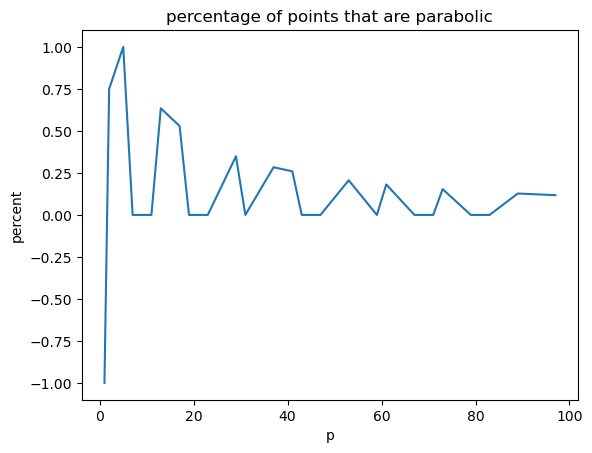

In [45]:
graphParabolicPercentage2(100)

In [65]:
findParabolicPercentage(43)

0.0

In [349]:
findParabolicPercentage(29)

0.34913793103448276

all triple length = 0 at prime1


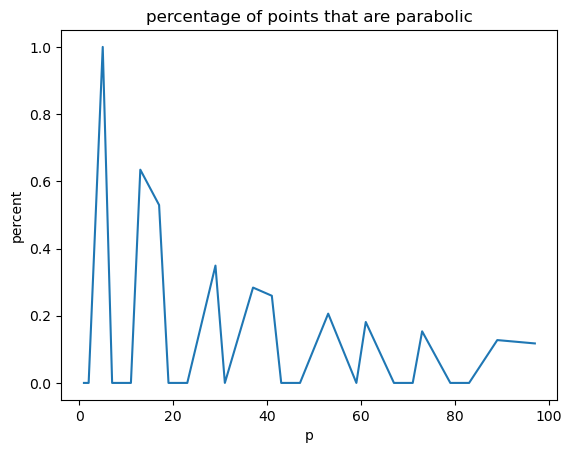

In [342]:
graphParabolicPercentage(100)

all triple length = 0 at prime1


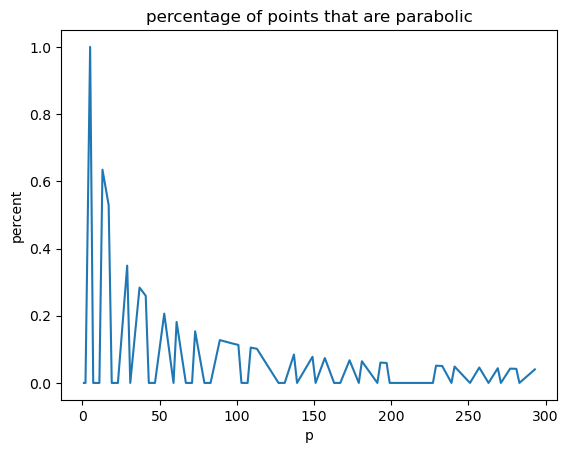

In [87]:
graphParabolicPercentage(300)

# parabolic path find

In [46]:
#function that checks if a point is parabolic, if yes, apply the parabolic way 

#what if both points are parabolic

#findformula v2: given P1, P2 with P1[i] == P2[i], find formula via orbit
def findFormulaInd(Point1, Point2, i, p ):
    orbits= findOrbit(Point1, i, p)
    
    if Point2 in orbits: 
       #     print("R"+str(rotNum+1) + "^" + str(orbits.index( Point2)+1))
           # print("point1, point2 in find formula")
          #  print(Point1, Point2)
          #  print("ORBITS of" + str(Point1))
         #   print( orbits)
            result = ("R"+str(i+1) + "^" + str(orbits.index( Point2)))
            if applyPath(Point1,result,p) != Point2: 
                raise Exception("path incorrect in findformulaind")
            return result #(orbits.index( Point2)+1, rotNum+1)
    
    raise Exception("Point2 not in orbit of point 1" + str(Point1) + str(Point2))


# connect a point that is in the cage to a point that is parabolic
# assumes point1 is in the cage and checks if point2 is parabolic 
def parabolicPathFind (Point1, Point2, p): 
    #exception: if point2 in orbit of point1, 
    if findFormula(Point1, Point2, p)!=-1: 
        print(str(Point1)+str(Point2)+"are directly in the orbit of each other ")
        return findFormula(Point1, Point2, p)
    cage = findCage(p)
    if not Point1 in cage: 
        raise Exception("input point1 " +str(Point1)+"is not in the cage")
    # check if point2 is parabolic
    ind = checkParabolic2(Point2, p)
    if ind <0: 
        return -1 
    #check if maxi
    #find a list of max orders
    mOrd = findMaxOrd(Point1, p)
    
    #checks if maximal index of point1 is the same as parabolic index at point2
    if ind in mOrd:
        mOrd.remove (ind)
    
    if mOrd == []: 
        print("max index at P1 = parabolic index at P2")
        return -1
    
    #[0,1,2] / {i U j}
    checkIndex = [0,1,2]
    checkIndex.remove( mOrd)
    checkIndex.remove(ind)
    
    P2Ord = findOrder(Point2, ind, p)
    #check if any of the points has same jth coordinate as the other point 
   # MPoint1 = [0,0,0]
    for trip in findOrbit(Point2, ind, p): 
        if(trip[mOrd[0]] == Point1[mOrd[0]] and trip in cage): 
            result = " "+findFormulaInd(trip,Point2, ind, p) +" "+ findFormulaInd(Point1, trip, mOrd[0], p)+" "
            if applyPath(Point1, result, p)!= Point2: 
                raise Exception("path incorrect in parabolicpathfind")
            return result
    raise Exception("no path found")            
    return -1
        
           # return(trip)
        
            
    
    

In [3]:
graphLifts(11)

NameError: name 'graphLifts' is not defined

In [37]:
findOrbit([28,20,20], 2, 29)

[[28, 20, 20],
 [20, 12, 20],
 [12, 4, 20],
 [4, 25, 20],
 [25, 17, 20],
 [17, 9, 20],
 [9, 1, 20],
 [1, 22, 20],
 [22, 14, 20],
 [14, 6, 20],
 [6, 27, 20],
 [27, 19, 20],
 [19, 11, 20],
 [11, 3, 20],
 [3, 24, 20],
 [24, 16, 20],
 [16, 8, 20],
 [8, 0, 20],
 [0, 21, 20],
 [21, 13, 20],
 [13, 5, 20],
 [5, 26, 20],
 [26, 18, 20],
 [18, 10, 20],
 [10, 2, 20],
 [2, 23, 20],
 [23, 15, 20],
 [15, 7, 20],
 [7, 28, 20]]

In [36]:
findOrbit([0,8,20], 2, 29)

[[0, 8, 20],
 [8, 16, 20],
 [16, 24, 20],
 [24, 3, 20],
 [3, 11, 20],
 [11, 19, 20],
 [19, 27, 20],
 [27, 6, 20],
 [6, 14, 20],
 [14, 22, 20],
 [22, 1, 20],
 [1, 9, 20],
 [9, 17, 20],
 [17, 25, 20],
 [25, 4, 20],
 [4, 12, 20],
 [12, 20, 20],
 [20, 28, 20],
 [28, 7, 20],
 [7, 15, 20],
 [15, 23, 20],
 [23, 2, 20],
 [2, 10, 20],
 [10, 18, 20],
 [18, 26, 20],
 [26, 5, 20],
 [5, 13, 20],
 [13, 21, 20],
 [21, 0, 20]]

2

In [461]:
findOrbit([0,8,20], 2, 29)
#findOrbit([28,20,20], 2, 29)

[[0, 8, 20],
 [8, 16, 20],
 [16, 24, 20],
 [24, 3, 20],
 [3, 11, 20],
 [11, 19, 20],
 [19, 27, 20],
 [27, 6, 20],
 [6, 14, 20],
 [14, 22, 20],
 [22, 1, 20],
 [1, 9, 20],
 [9, 17, 20],
 [17, 25, 20],
 [25, 4, 20],
 [4, 12, 20],
 [12, 20, 20],
 [20, 28, 20],
 [28, 7, 20],
 [7, 15, 20],
 [15, 23, 20],
 [23, 2, 20],
 [2, 10, 20],
 [10, 18, 20],
 [18, 26, 20],
 [26, 5, 20],
 [5, 13, 20],
 [13, 21, 20],
 [21, 0, 20]]

In [465]:
findOrbit([28,20,20], 2, 29)

[[28, 20, 20],
 [20, 12, 20],
 [12, 4, 20],
 [4, 25, 20],
 [25, 17, 20],
 [17, 9, 20],
 [9, 1, 20],
 [1, 22, 20],
 [22, 14, 20],
 [14, 6, 20],
 [6, 27, 20],
 [27, 19, 20],
 [19, 11, 20],
 [11, 3, 20],
 [3, 24, 20],
 [24, 16, 20],
 [16, 8, 20],
 [8, 0, 20],
 [0, 21, 20],
 [21, 13, 20],
 [13, 5, 20],
 [5, 26, 20],
 [26, 18, 20],
 [18, 10, 20],
 [10, 2, 20],
 [2, 23, 20],
 [23, 15, 20],
 [15, 7, 20],
 [7, 28, 20]]

In [464]:
findOrbit([8, 16, 20],0, 29)

[[8, 16, 20],
 [8, 20, 0],
 [8, 0, 9],
 [8, 9, 13],
 [8, 13, 13],
 [8, 13, 9],
 [8, 9, 0],
 [8, 0, 20],
 [8, 20, 16],
 [8, 16, 16]]

In [463]:
findOrbit([0,8,20], 0, 29)

[[0, 8, 20], [0, 20, 21], [0, 21, 9], [0, 9, 8]]

In [454]:
findOrbit([0,21,20], 2, 29)

[[0, 21, 20],
 [21, 13, 20],
 [13, 5, 20],
 [5, 26, 20],
 [26, 18, 20],
 [18, 10, 20],
 [10, 2, 20],
 [2, 23, 20],
 [23, 15, 20],
 [15, 7, 20],
 [7, 28, 20],
 [28, 20, 20],
 [20, 12, 20],
 [12, 4, 20],
 [4, 25, 20],
 [25, 17, 20],
 [17, 9, 20],
 [9, 1, 20],
 [1, 22, 20],
 [22, 14, 20],
 [14, 6, 20],
 [6, 27, 20],
 [27, 19, 20],
 [19, 11, 20],
 [11, 3, 20],
 [3, 24, 20],
 [24, 16, 20],
 [16, 8, 20],
 [8, 0, 20]]

In [460]:
parabolicPathFind( [0, 8, 20],[8,0,20], 29)

check point1, point2 in findformula:
[0, 8, 20] [8, 0, 20]
max index at P1 = parabolic index at P2


-1

In [468]:
parabolicPathFind([1, 20,22], [20,0,8], 29)

['R1^20']
['R3^1']
['R1^20', 'R3^1']


' R1^20 R3^1 '

In [472]:
findOrbit([12,20,20], 2, 29)

[[12, 20, 20],
 [20, 28, 20],
 [28, 7, 20],
 [7, 15, 20],
 [15, 23, 20],
 [23, 2, 20],
 [2, 10, 20],
 [10, 18, 20],
 [18, 26, 20],
 [26, 5, 20],
 [5, 13, 20],
 [13, 21, 20],
 [21, 0, 20],
 [0, 8, 20],
 [8, 16, 20],
 [16, 24, 20],
 [24, 3, 20],
 [3, 11, 20],
 [11, 19, 20],
 [19, 27, 20],
 [27, 6, 20],
 [6, 14, 20],
 [14, 22, 20],
 [22, 1, 20],
 [1, 9, 20],
 [9, 17, 20],
 [17, 25, 20],
 [25, 4, 20],
 [4, 12, 20]]

In [1]:
findOrbit([0,8,20], 0, 29)

NameError: name 'findOrbit' is not defined

In [470]:
parabolicPathFind( [28,20,20],[0,20,8], 29)

check point1, point2 in findformula:
[28, 20, 20] [0, 20, 8]
['R2^13']


Exception: Point2 not in orbit of point 1[28, 20, 20][12, 20, 20]

In [447]:
parabolicPathFind([0, 8, 20], [0, 21, 9], 29)

point1, point2 in find formula
[0, 8, 20] [0, 21, 9]
ORBITS of[0, 8, 20]
[[0, 8, 20], [0, 20, 21], [0, 21, 9], [0, 9, 8]]
[0, 8, 20][0, 21, 9]are directly in the orbit of each other 
point1, point2 in find formula
[0, 8, 20] [0, 21, 9]
ORBITS of[0, 8, 20]
[[0, 8, 20], [0, 20, 21], [0, 21, 9], [0, 9, 8]]


'R1^2'

In [413]:
#tests of findparabolic 
def testParabolic(p): 
    cage = findCage(p)
    parabolic = findAllParabolic(p)
    print(parabolic)
    for cagePt in cage: 
        for paraPt in parabolic:
            print("testing point" + str(cagePt)+ str(paraPt))
            parabolicPathFind( cagePt, paraPt, p)

In [432]:
testParabolic(29)

[[0, 8, 9], [0, 8, 20], [0, 9, 8], [0, 9, 21], [0, 20, 8], [0, 20, 21], [0, 21, 9], [0, 21, 20], [1, 7, 9], [1, 9, 7], [1, 9, 20], [1, 20, 9], [1, 20, 22], [1, 22, 20], [2, 6, 9], [2, 9, 6], [2, 9, 19], [2, 10, 20], [2, 19, 9], [2, 20, 10], [2, 20, 23], [2, 23, 20], [3, 5, 9], [3, 9, 5], [3, 9, 18], [3, 11, 20], [3, 18, 9], [3, 20, 11], [3, 20, 24], [3, 24, 20], [4, 4, 9], [4, 9, 4], [4, 9, 17], [4, 12, 20], [4, 17, 9], [4, 20, 12], [4, 20, 25], [4, 25, 20], [5, 3, 9], [5, 9, 3], [5, 9, 16], [5, 13, 20], [5, 16, 9], [5, 20, 13], [5, 20, 26], [5, 26, 20], [6, 2, 9], [6, 9, 2], [6, 9, 15], [6, 14, 20], [6, 15, 9], [6, 20, 14], [6, 20, 27], [6, 27, 20], [7, 1, 9], [7, 9, 1], [7, 9, 14], [7, 14, 9], [7, 15, 20], [7, 20, 15], [7, 20, 28], [7, 28, 20], [8, 0, 9], [8, 0, 20], [8, 9, 0], [8, 9, 13], [8, 13, 9], [8, 16, 20], [8, 20, 0], [8, 20, 16], [10, 2, 20], [10, 9, 11], [10, 9, 27], [10, 11, 9], [10, 18, 20], [10, 20, 2], [10, 20, 18], [10, 27, 9], [11, 3, 20], [11, 9, 10], [11, 9, 26], [1

Exception: Point2 not in orbit of point 1[0, 8, 20][28, 20, 20]

In [396]:
findOrbit([22, 20, 14], 1, 29)

[[22, 20, 14],
 [14, 20, 6],
 [6, 20, 27],
 [27, 20, 19],
 [19, 20, 11],
 [11, 20, 3],
 [3, 20, 24],
 [24, 20, 16],
 [16, 20, 8],
 [8, 20, 0],
 [0, 20, 21],
 [21, 20, 13],
 [13, 20, 5],
 [5, 20, 26],
 [26, 20, 18],
 [18, 20, 10],
 [10, 20, 2],
 [2, 20, 23],
 [23, 20, 15],
 [15, 20, 7],
 [7, 20, 28],
 [28, 20, 20],
 [20, 20, 12],
 [12, 20, 4],
 [4, 20, 25],
 [25, 20, 17],
 [17, 20, 9],
 [9, 20, 1],
 [1, 20, 22]]

In [407]:
parabolicPathFind([3, 4, 15],[22, 20, 14], 29)

['R2^23']
['R1^6']
['R2^23', 'R1^6']


' R2^23 R1^6 '

In [381]:
findOrbit([3, 20, 24], [0], 29)

[[3, 20, 24],
 [3, 24, 22],
 [3, 22, 0],
 [3, 0, 7],
 [3, 7, 5],
 [3, 5, 9],
 [3, 9, 18],
 [3, 18, 8],
 [3, 8, 25],
 [3, 25, 14],
 [3, 14, 14],
 [3, 14, 25],
 [3, 25, 8],
 [3, 8, 18],
 [3, 18, 9],
 [3, 9, 5],
 [3, 5, 7],
 [3, 7, 0],
 [3, 0, 22],
 [3, 22, 24],
 [3, 24, 20],
 [3, 20, 11],
 [3, 11, 21],
 [3, 21, 4],
 [3, 4, 15],
 [3, 15, 15],
 [3, 15, 4],
 [3, 4, 21],
 [3, 21, 11],
 [3, 11, 20]]

In [373]:
findCage(29)

[[0, 2, 5],
 [0, 3, 7],
 [0, 3, 22],
 [0, 4, 10],
 [0, 4, 19],
 [0, 5, 2],
 [0, 5, 27],
 [0, 6, 14],
 [0, 6, 15],
 [0, 7, 3],
 [0, 8, 9],
 [0, 8, 20],
 [0, 9, 8],
 [0, 9, 21],
 [0, 10, 4],
 [0, 10, 25],
 [0, 11, 13],
 [0, 11, 16],
 [0, 13, 11],
 [0, 13, 18],
 [0, 14, 6],
 [0, 14, 23],
 [0, 15, 6],
 [0, 15, 23],
 [0, 16, 11],
 [0, 16, 18],
 [0, 18, 13],
 [0, 18, 16],
 [0, 19, 4],
 [0, 19, 25],
 [0, 20, 8],
 [0, 20, 21],
 [0, 21, 9],
 [0, 21, 20],
 [0, 22, 3],
 [0, 22, 26],
 [0, 23, 14],
 [0, 23, 15],
 [0, 25, 10],
 [0, 25, 19],
 [0, 26, 22],
 [0, 27, 5],
 [1, 2, 5],
 [1, 5, 2],
 [1, 5, 13],
 [1, 7, 9],
 [1, 9, 7],
 [1, 9, 20],
 [1, 13, 5],
 [1, 16, 24],
 [1, 17, 22],
 [1, 20, 9],
 [1, 20, 22],
 [1, 22, 17],
 [1, 22, 20],
 [1, 24, 16],
 [2, 0, 5],
 [2, 1, 5],
 [2, 2, 18],
 [2, 5, 0],
 [2, 5, 1],
 [2, 6, 9],
 [2, 9, 6],
 [2, 9, 19],
 [2, 10, 20],
 [2, 18, 2],
 [2, 18, 19],
 [2, 19, 9],
 [2, 19, 18],
 [2, 20, 10],
 [2, 20, 23],
 [2, 23, 20],
 [3, 0, 7],
 [3, 0, 22],
 [3, 4, 15],
 [3, 4, 21

In [352]:
checkParabolic([22, 20, 14], 29)

1

In [38]:
graphLifts(11)

NameError: name 'graphLifts' is not defined

In [57]:
graphLifts( 11)

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]


NameError: name 'maxOrd' is not defined

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
['R1^1']
['R1^1']
POINT@:
[1, 2, 1]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
point1, point2 in find formula
[1, 1, 2] [1, 2, 1]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 15], [1, 15, 13], [1, 13, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
point1, point2 in find formula
[1, 1, 2] [1, 2, 1]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 15], [1, 15, 13], [1, 13, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
['R1^7', 'R1^1']
['R1^7', 'R1^1']
POINT@:
[1, 2, 5]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
point1, point2 in find formula
[1, 1, 2] [1, 2, 5]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 15], [1, 15, 13], [1, 13, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
point1, point2 in find formula
[1, 1, 2] [1, 2, 5]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 15], [1, 15, 13], [1, 13, 5], [1, 

[0.0,
 0.6309297535714574,
 6.713817262281928,
 1.4649735207179269,
 1697.1290310118168,
 5.837781921174978,
 10.217960226821939,
 953.0543810333915,
 3944.138964361129,
 12.84606750370535,
 11.093995985766199,
 6378.9378253562245,
 525.7173949767164,
 11.970031744734053,
 1867.540873823178,
 732.0610595542006,
 197.4282672013137,
 1836.8405414776716,
 6.713817262281928,
 1.4649735207179269,
 2291.8741394459857,
 304.6095838178357,
 22.319168923964533,
 2575.7690759642933,
 3711.3488220375216,
 4563.033631592443,
 11.08751755291566,
 588.504520336143,
 3427.4538855192145,
 4846.928568110749,
 1724.0842664093716,
 872.3994568544501,
 5414.7184411473645,
 2859.6640124826,
 3143.5589490009074,
 5130.823504629057,
 1440.1893298910643,
 1156.2943933727572,
 9.482995928578312,
 1221.5528249450083,
 1379.6536300564337,
 346.6505980083149,
 6737.534837186194,
 5877.073304866072,
 1004.6189536948882,
 73.12962694191367,
 181.91728491813066,
 614.3949272768112,
 654.7223893666995,
 1472.39607178

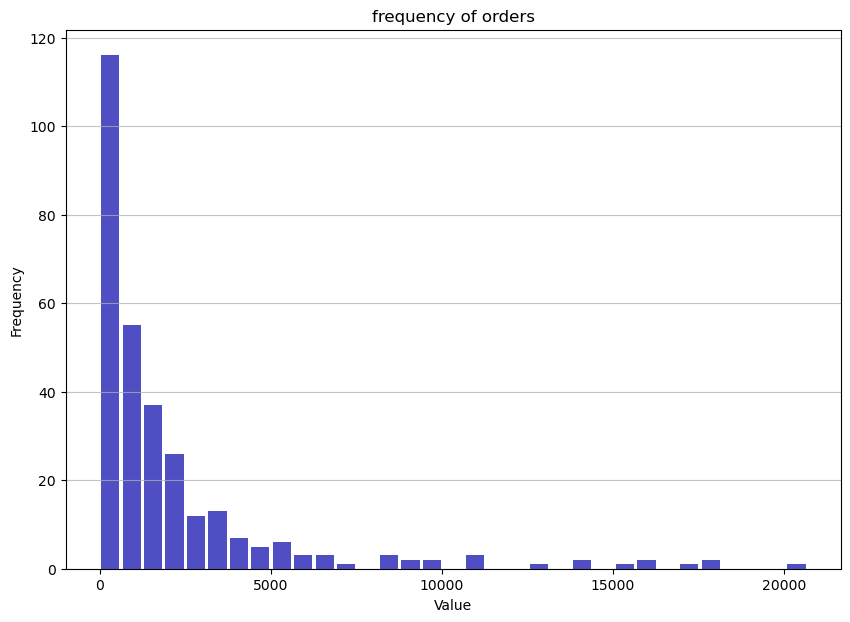

In [345]:
graphLifts(19)

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
point1, point2 in find formula
[1, 1, 1] [1, 1, 2]
ORBITS of[1, 1, 1]
[[1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 34], [1, 34, 3], [1, 3, 18], [1, 18, 8], [1, 8, 6], [1, 6, 10], [1, 10, 24], [1, 24, 19], [1, 19, 33], [1, 33, 37], [1, 37, 35], [1, 35, 25], [1, 25, 40], [1, 40, 9], [1, 9, 30], [1, 30, 38], [1, 38, 41], [1, 41, 42], [1, 42, 42], [1, 42, 41], [1, 41, 38], [1, 38, 30], [1, 30, 9], [1, 9, 40], [1, 40, 25], [1, 25, 35], [1, 35, 37], [1, 37, 33], [1, 33, 19], [1, 19, 24], [1, 24, 10], [1, 10, 6], [1, 6, 8], [1, 8, 18], [1, 18, 3], [1, 3, 34], [1, 34, 13], [1, 13, 5], [1, 5, 2], [1, 2, 1]]
point1, point2 in find formula
[1, 1, 1] [1, 1, 2]
ORBITS of[1, 1, 1]
[[1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 34], [1, 34, 3], [1, 3, 18], [1, 18, 8], [1, 8, 6], [1, 6, 10], [1, 10, 24], [1, 24, 19], [1, 19, 33], [1, 33, 37], [1, 37, 35], [1, 35, 25], [1, 25, 40], [1, 40, 9], [1, 9, 30], [1, 30, 38], [1, 38, 41], [1, 41, 42], [1, 

[0.0,
 0.6309297535714574,
 37.375068754918026,
 1.4649735207179269,
 4.961749026286794,
 33.87092571903048,
 36.499032995946145,
 2.3347175194727927,
 31.24281844211483,
 7.589852960288124,
 6.713817262281928,
 32.11885420108671,
 15.474174780620904,
 23.35849661136787,
 30.366782683142947,
 8.465888710365235,
 35.62299723697425,
 3.2098316767340234,
 32.9948899600586,
 5.837781921174978,
 28.614711165199175,
 10.217960226821939,
 29.49074692417106,
 9.34192446803939,
 25.110568129311638,
 13.72210326267715,
 22.48246085239598,
 16.350210539592787,
 27.73867540622729,
 11.093995985766199,
 4.0857328977940774,
 34.74696147800237,
 12.84606750370535,
 25.986603888283522,
 26.862639647255406,
 11.970031744734053,
 21.606425093424097,
 17.226246298564675,
 14.59813902164902,
 24.234532370339753,
 20.730389334452212,
 18.10228205753656,
 19.854353575480328,
 18.978317816508444,
 37.375068754918026,
 1.4649735207179269,
 41.573428417196304,
 30.341777046144436,
 28.737255421708458,
 43.1779

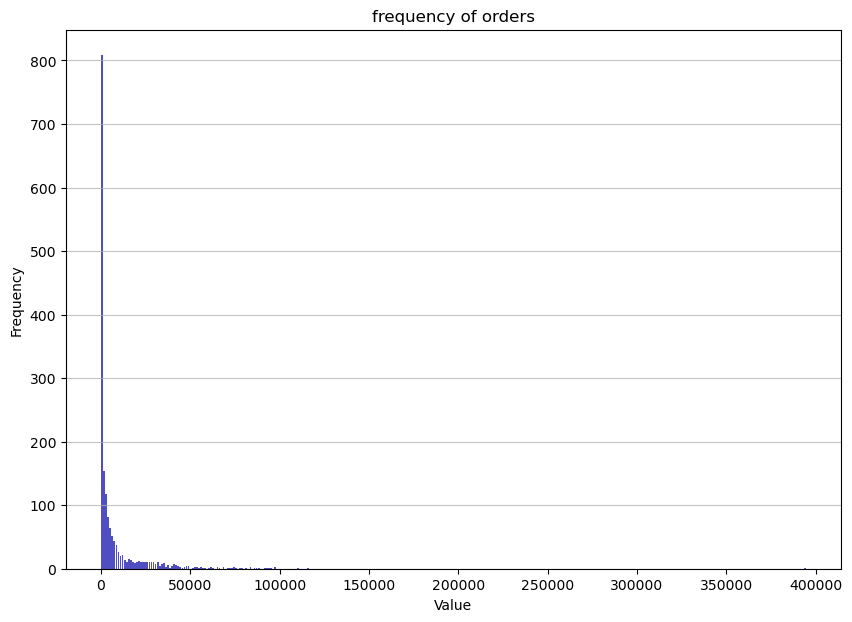

In [354]:
graphLifts(43)

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
both not in cage
['R1^3']
MP!
[1, 5, 13]
POINT@:
[1, 1, 2]
order large than sqrt
path1
 R1^2
['R1^2']
interpoint: 
[1, 5, 13]
['R1^2']
['R1^2']
['R1^2']
['R1^2']
rotnum:
0
rot:
R1^2
14
['R1^14']
['R1^2']
['R1^14']
['R1^14', 'R1^3']
['R1^14', 'R1^3']
POINT@:
[1, 2, 1]
both not in cage
['R1^3']
MP!
[1, 5, 13]
POINT@:
[1, 2, 1]
order large than sqrt
path1
 R1^4
['R1^4']
interpoint: 
[1, 5, 13]
['R1^4']
['R1^4']
['R1^4']
['R1^4']
rotnum:
0
rot:
R1^4
12
['R1^12']
['R1^4']
['R1^12']
['R1^12', 'R1^3']
['R1^12', 'R1^3']
POINT@:
[1, 2, 5]
both not in cage
['R1^3']
MP!
[1, 5, 13]
POINT@:
[1, 2, 5]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 5, 13]
['R1^1']
['R1^1']
['R1^1']
['R1^1']
rotnum:
0
rot:
R1^1
15
['R1^15']
['R1^1']
['R1^15']
['R1^15', 'R1^3']
['R1^15', 'R1^3']
POINT@:
[1, 5, 2]
both not in cage
['R1^3']
MP!
[1, 5, 13]
POINT@:
[1, 5, 2]
order large than sqrt
path1
 R1^5
['R1^5']
interpoint: 
[1, 5, 13]
['R1^5']
['R1^5']
['R1^5']
['R1

[0.0,
 14.59813902164902,
 12.84606750370535,
 15.474174780620904,
 11.970031744734053,
 2.3347175194727927,
 6573.722259032611,
 2988.1163211021944,
 9225.060883988554,
 8008.584025373824,
 54682.349757645105,
 117660.2712729532,
 42486.700876654155,
 4994.064826681341,
 11.093995985766199,
 3.2098316767340234,
 53501.674973797584,
 75598.30553769531,
 91629.2224009221,
 99068.09620816677,
 20604.168328435444,
 840456.7813654086,
 207265.21248207317,
 30317.009627077772,
 15447.478153245012,
 29172.85223442725,
 30605.966660225447,
 26264.94469306031,
 67436.22529073527,
 64235.868685651134,
 28290.977160069044,
 222106.56053565204,
 10.217960226821939,
 4.0857328977940774,
 192423.86442849427,
 79885.98160917177,
 30313.517596508245,
 37662.39052540477,
 13677.537332358312,
 1949618.8059594433,
 58430.930659386824,
 297651.61305187596,
 9.34192446803939,
 4.961749026286794,
 8.465888710365235,
 5.837781921174978,
 7.589852960288124,
 20.730389334452212,
 2406524.5924340673,
 2527045.

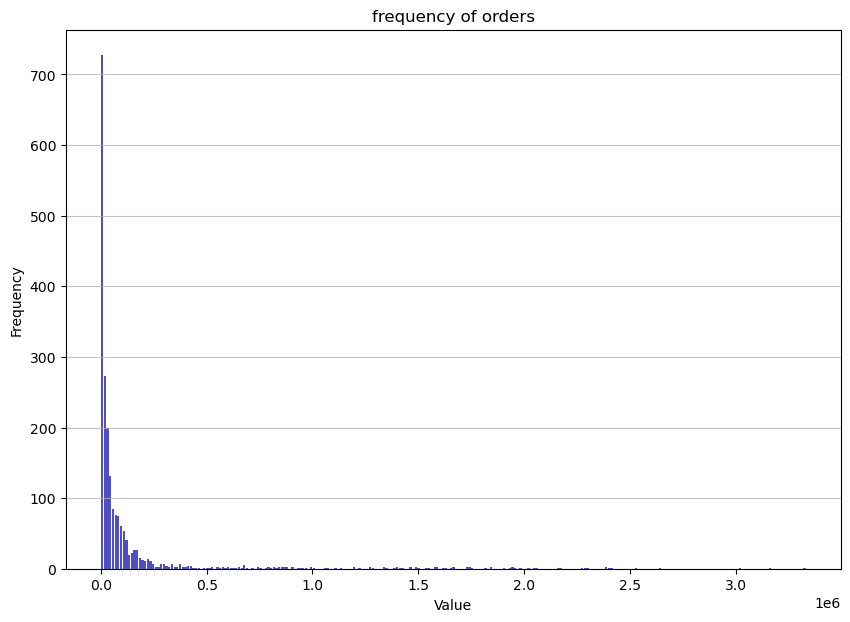

In [86]:
graphLifts(47)

In [327]:
findPath([1, 1, 2], [1, 6, 9], 11)

check point1, point2 in findformula:
[1, 1, 2] [1, 6, 9]
[]


Exception: no path found at [1, 1, 2][1, 6, 9]

In [304]:
findOrbit([1, 6, 9], 2, 11)

[[1, 6, 9],
 [6, 7, 9],
 [7, 7, 9],
 [7, 6, 9],
 [6, 1, 9],
 [1, 10, 9],
 [10, 5, 9],
 [5, 4, 9],
 [4, 4, 9],
 [4, 5, 9],
 [5, 10, 9],
 [10, 1, 9]]

In [298]:
findOrbit([1, 1, 2], 0, 11 )

[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]

In [254]:
findPathCrossCage([1, 5, 13], [1, 1, 2], 19)

order large than sqrt
path1
 R1^4
['R1^4']
interpoint: 
[1, 5, 2]
[([3, 2, 2], [3, 2, 2], 2, 2), ([2, 9, 2], [2, 9, 2], 2, 2), ([17, 16, 2], [17, 16, 2], 2, 2), ([2, 9, 2], [2, 3, 2], 2, 2), ([17, 16, 2], [17, 10, 2], 2, 2), ([9, 2, 2], [9, 2, 2], 2, 2), ([10, 5, 2], [10, 5, 2], 2, 2), ([9, 2, 2], [9, 14, 2], 2, 2), ([10, 5, 2], [10, 17, 2], 2, 2), ([5, 10, 2], [5, 10, 2], 2, 2), ([14, 9, 2], [14, 9, 2], 2, 2), ([9, 14, 2], [9, 2, 2], 2, 2), ([10, 17, 2], [10, 5, 2], 2, 2), ([9, 14, 2], [9, 14, 2], 2, 2), ([10, 17, 2], [10, 17, 2], 2, 2), ([2, 3, 2], [2, 9, 2], 2, 2), ([17, 10, 2], [17, 16, 2], 2, 2), ([2, 3, 2], [2, 3, 2], 2, 2), ([17, 10, 2], [17, 10, 2], 2, 2), ([16, 17, 2], [16, 17, 2], 2, 2)]
point1, point2 in find formula
[1, 5, 2] [3, 2, 2]
ORBITS of[1, 5, 2]
[[1, 5, 2], [5, 10, 2], [10, 17, 2], [17, 16, 2], [16, 3, 2], [3, 2, 2], [2, 9, 2], [9, 14, 2], [14, 18, 2], [18, 18, 2], [18, 14, 2], [14, 9, 2], [9, 2, 2], [2, 3, 2], [3, 16, 2], [16, 17, 2], [17, 10, 2], [10, 5, 2], [5, 

'R3^14  R3^5   R1^4'

In [291]:
cage = findCage(11)
for a in cage:
    for b in cage: 
        MPList = filterList(cagePath(a, b, 11), 11)
      #  MPList = cagePath(a, b, 11), 11
        print(MPList)

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

KeyboardInterrupt: 

In [190]:
cage = findCage(19)
for a in cage:
    for b in cage: 
        MPList = filterList(cagePath(a, b, 19), 19)
      #  MPList = cagePath(a, b, 11), 11
        print(MPList)

[([3, 2, 2], [3, 2, 2], 2, 2), ([2, 9, 2], [2, 9, 2], 2, 2), ([17, 16, 2], [17, 16, 2], 2, 2), ([2, 9, 2], [2, 3, 2], 2, 2), ([17, 16, 2], [17, 10, 2], 2, 2), ([9, 2, 2], [9, 2, 2], 2, 2), ([10, 5, 2], [10, 5, 2], 2, 2), ([9, 2, 2], [9, 14, 2], 2, 2), ([10, 5, 2], [10, 17, 2], 2, 2), ([5, 10, 2], [5, 10, 2], 2, 2), ([14, 9, 2], [14, 9, 2], 2, 2), ([9, 14, 2], [9, 2, 2], 2, 2), ([10, 17, 2], [10, 5, 2], 2, 2), ([9, 14, 2], [9, 14, 2], 2, 2), ([10, 17, 2], [10, 17, 2], 2, 2), ([2, 3, 2], [2, 9, 2], 2, 2), ([17, 10, 2], [17, 16, 2], 2, 2), ([2, 3, 2], [2, 3, 2], 2, 2), ([17, 10, 2], [17, 10, 2], 2, 2), ([16, 17, 2], [16, 17, 2], 2, 2)]
[([2, 9, 2], [2, 2, 9], 2, 1), ([17, 16, 2], [17, 2, 16], 2, 1), ([2, 9, 2], [2, 2, 3], 2, 1), ([17, 16, 2], [17, 2, 10], 2, 1), ([9, 2, 2], [9, 2, 2], 2, 1), ([10, 5, 2], [10, 2, 5], 2, 1), ([9, 2, 2], [9, 2, 14], 2, 1), ([10, 5, 2], [10, 2, 17], 2, 1), ([9, 14, 2], [9, 2, 2], 2, 1), ([10, 17, 2], [10, 2, 5], 2, 1), ([9, 14, 2], [9, 2, 14], 2, 1), ([10, 17

KeyboardInterrupt: 

In [329]:
findPath([1, 1, 2], [14, 4, 10], 19)

[([2, 9, 2], [2, 5, 10], 2, 2), ([17, 16, 2], [17, 2, 10], 2, 2), ([2, 9, 2], [2, 17, 10], 2, 2), ([17, 16, 2], [17, 14, 10], 2, 2), ([2, 3, 2], [2, 5, 10], 2, 2), ([17, 10, 2], [17, 2, 10], 2, 2), ([2, 3, 2], [2, 17, 10], 2, 2), ([17, 10, 2], [17, 14, 10], 2, 2)]
point1, point2 in find formula
[1, 1, 2] [2, 9, 2]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 5, 2], [5, 10, 2], [10, 17, 2], [17, 16, 2], [16, 3, 2], [3, 2, 2], [2, 9, 2], [9, 14, 2], [14, 18, 2], [18, 18, 2], [18, 14, 2], [14, 9, 2], [9, 2, 2], [2, 3, 2], [3, 16, 2], [16, 17, 2], [17, 10, 2], [10, 5, 2], [5, 1, 2]]
point1, point2 in find formula
[2, 9, 2] [2, 5, 10]
ORBITS of[2, 9, 2]
[[2, 9, 2], [2, 2, 3], [2, 3, 16], [2, 16, 17], [2, 17, 10], [2, 10, 5], [2, 5, 1], [2, 1, 1], [2, 1, 5], [2, 5, 10], [2, 10, 17], [2, 17, 16], [2, 16, 3], [2, 3, 2], [2, 2, 9], [2, 9, 14], [2, 14, 18], [2, 18, 18], [2, 18, 14], [2, 14, 9]]
point1, point2 in find formula
[2, 5, 10] [14, 4, 10]
ORBITS of[2, 5, 10]
[[2, 5, 10], [5, 15, 10], [15, 8, 10],

'R3^11 R1^9 R3^7 '

In [156]:
findCage(11)

[[1, 1, 2],
 [1, 2, 1],
 [1, 2, 5],
 [1, 5, 2],
 [1, 6, 9],
 [1, 9, 6],
 [1, 9, 10],
 [1, 10, 9],
 [1, 10, 10],
 [2, 1, 1],
 [2, 1, 5],
 [2, 4, 6],
 [2, 4, 7],
 [2, 5, 1],
 [2, 5, 7],
 [2, 6, 4],
 [2, 6, 10],
 [2, 7, 4],
 [2, 7, 5],
 [2, 10, 6],
 [2, 10, 10],
 [4, 2, 6],
 [4, 2, 7],
 [4, 4, 9],
 [4, 5, 7],
 [4, 5, 9],
 [4, 6, 2],
 [4, 7, 2],
 [4, 7, 5],
 [4, 9, 4],
 [4, 9, 5],
 [5, 1, 2],
 [5, 2, 1],
 [5, 2, 7],
 [5, 4, 7],
 [5, 4, 9],
 [5, 7, 2],
 [5, 7, 4],
 [5, 9, 4],
 [5, 9, 10],
 [5, 10, 9],
 [6, 1, 9],
 [6, 2, 4],
 [6, 2, 10],
 [6, 4, 2],
 [6, 7, 9],
 [6, 9, 1],
 [6, 9, 7],
 [6, 10, 2],
 [7, 2, 4],
 [7, 2, 5],
 [7, 4, 2],
 [7, 4, 5],
 [7, 5, 2],
 [7, 5, 4],
 [7, 6, 9],
 [7, 7, 9],
 [7, 9, 6],
 [7, 9, 7],
 [9, 1, 6],
 [9, 1, 10],
 [9, 4, 4],
 [9, 4, 5],
 [9, 5, 4],
 [9, 5, 10],
 [9, 6, 1],
 [9, 6, 7],
 [9, 7, 6],
 [9, 7, 7],
 [9, 10, 1],
 [9, 10, 5],
 [10, 1, 9],
 [10, 1, 10],
 [10, 2, 6],
 [10, 2, 10],
 [10, 5, 9],
 [10, 6, 2],
 [10, 9, 1],
 [10, 9, 5],
 [10, 10, 1],
 [10, 10, 2]

In [325]:
findPath([7, 5, 2], [9, 1, 10], 11)

[]


Exception: no path found at [7, 5, 2][9, 1, 10]

In [323]:
findPath([10,10, 2], [10,10,1], 11)

point1, point2 in find formula
[10, 10, 2] [10, 10, 1]
ORBITS of[10, 10, 2]
[[10, 10, 2], [10, 2, 6], [10, 6, 2], [10, 2, 10], [10, 10, 1], [10, 1, 9], [10, 9, 5], [10, 5, 9], [10, 9, 1], [10, 1, 10]]
point1, point2 in find formula
[10, 10, 2] [10, 10, 1]
ORBITS of[10, 10, 2]
[[10, 10, 2], [10, 2, 6], [10, 6, 2], [10, 2, 10], [10, 10, 1], [10, 1, 9], [10, 9, 5], [10, 5, 9], [10, 9, 1], [10, 1, 10]]


'R1^4'

In [324]:
findOrbit([10,10,2], 0, 11)

[[10, 10, 2],
 [10, 2, 6],
 [10, 6, 2],
 [10, 2, 10],
 [10, 10, 1],
 [10, 1, 9],
 [10, 9, 5],
 [10, 5, 9],
 [10, 9, 1],
 [10, 1, 10]]

In [172]:
orbitMpoints([1, 1, 2], [14, 4, 10], 19)

2
2


([17, 2, 10], [17, 2, 10])

In [322]:
findPath([2, 9, 2], [2, 17, 10], 19)

point1, point2 in find formula
[2, 9, 2] [2, 17, 10]
ORBITS of[2, 9, 2]
[[2, 9, 2], [2, 2, 3], [2, 3, 16], [2, 16, 17], [2, 17, 10], [2, 10, 5], [2, 5, 1], [2, 1, 1], [2, 1, 5], [2, 5, 10], [2, 10, 17], [2, 17, 16], [2, 16, 3], [2, 3, 2], [2, 2, 9], [2, 9, 14], [2, 14, 18], [2, 18, 18], [2, 18, 14], [2, 14, 9]]
point1, point2 in find formula
[2, 9, 2] [2, 17, 10]
ORBITS of[2, 9, 2]
[[2, 9, 2], [2, 2, 3], [2, 3, 16], [2, 16, 17], [2, 17, 10], [2, 10, 5], [2, 5, 1], [2, 1, 1], [2, 1, 5], [2, 5, 10], [2, 10, 17], [2, 17, 16], [2, 16, 3], [2, 3, 2], [2, 2, 9], [2, 9, 14], [2, 14, 18], [2, 18, 18], [2, 18, 14], [2, 14, 9]]


'R1^4'

In [ ]:
applyPath([1, 1, 2], "R3^11 R1^9 R3^7", 19)

In [ ]:
#test functions (roti ^ j)
def applyRotation(i, j, List, p): 
    initial = List
    Operation = Rot1
    if i == 2: 
        Operation = Rot2
    if i == 3: 
        Operation = Rot3
    for o in range (j):
        initial = Operation(initial[0], initial[1], initial[2])
        initial = [initial[0]%p, initial[1]%p, initial[2]%p]
    
    return initial
    

In [314]:
orbitMpoints([7, 5, 2], [5, 7, 2], 11)

2
2


-1

In [313]:
print(findPath([5, 7, 2],[7, 5, 2], 11))

point1, point2 in find formula
[5, 7, 2] [7, 5, 2]
ORBITS of[5, 7, 2]
[[5, 7, 2], [7, 4, 2], [4, 6, 2], [6, 10, 2], [10, 10, 2], [10, 6, 2], [6, 4, 2], [4, 7, 2], [7, 5, 2], [5, 1, 2], [1, 1, 2], [1, 5, 2]]
point1, point2 in find formula
[5, 7, 2] [7, 5, 2]
ORBITS of[5, 7, 2]
[[5, 7, 2], [7, 4, 2], [4, 6, 2], [6, 10, 2], [10, 10, 2], [10, 6, 2], [6, 4, 2], [4, 7, 2], [7, 5, 2], [5, 1, 2], [1, 1, 2], [1, 5, 2]]
R3^8


In [320]:
findOrbit([6, 2, 4], 0, 11)

[[6, 2, 4], [6, 4, 4], [6, 4, 2], [6, 2, 10], [6, 10, 2]]

In [321]:
orbitMpoints([5, 7, 2], [6, 2, 4], 11)

2
1


-1

In [312]:
print(findPath([5, 7, 2],[6,2, 4], 11))

[]


Exception: no path found at [5, 7, 2][6, 2, 4]

In [311]:
print(findPath([5, 1, 2],[5, 2, 1], 11))

point1, point2 in find formula
[5, 1, 2] [5, 2, 1]
ORBITS of[5, 1, 2]
[[5, 1, 2], [5, 2, 7], [5, 7, 4], [5, 4, 9], [5, 9, 10], [5, 10, 9], [5, 9, 4], [5, 4, 7], [5, 7, 2], [5, 2, 1]]
point1, point2 in find formula
[5, 1, 2] [5, 2, 1]
ORBITS of[5, 1, 2]
[[5, 1, 2], [5, 2, 7], [5, 7, 4], [5, 4, 9], [5, 9, 10], [5, 10, 9], [5, 9, 4], [5, 4, 7], [5, 7, 2], [5, 2, 1]]
R1^9


In [ ]:
#output path from 


print(applyRotation (1, 2, [1, 2, 1],7))

print(applyRotation (2, 3, [1,1, 2],7))

print(applyRotation (1, 1, [6, 1, 6],7))

In [310]:
print(findPath([10,2,10],[6,2, 4], 11))

point1, point2 in find formula
[10, 2, 10] [6, 2, 4]
ORBITS of[10, 2, 10]
[[10, 2, 10], [10, 2, 6], [6, 2, 4], [4, 2, 7], [7, 2, 5], [5, 2, 1], [1, 2, 1], [1, 2, 5], [5, 2, 7], [7, 2, 4], [4, 2, 6], [6, 2, 10]]
point1, point2 in find formula
[10, 2, 10] [6, 2, 4]
ORBITS of[10, 2, 10]
[[10, 2, 10], [10, 2, 6], [6, 2, 4], [4, 2, 7], [7, 2, 5], [5, 2, 1], [1, 2, 1], [1, 2, 5], [5, 2, 7], [7, 2, 4], [4, 2, 6], [6, 2, 10]]
R2^2


In [308]:
findOrbit([10,2,10], 1, 11)

[[10, 2, 10],
 [10, 2, 6],
 [6, 2, 4],
 [4, 2, 7],
 [7, 2, 5],
 [5, 2, 1],
 [1, 2, 1],
 [1, 2, 5],
 [5, 2, 7],
 [7, 2, 4],
 [4, 2, 6],
 [6, 2, 10]]

In [169]:
orbitMpoints([10,2,10], [6, 2, 4], 11)

1
1


-1

In [170]:
orbitMpoints([7, 5, 2], [9,1,10], 11)

2
0


-1

In [143]:
applyPath([10,2,10], "R1^10", 11 )

['R1^10']


[10, 2, 10]

In [ ]:
print(findOrbit([6, 1, 6],1, 7))

In [ ]:
print(rearrange([1, 0, 1], [6, 6, 1], 2,0 ))

In [ ]:
print(cagePath([7, 5, 4], [9,7,7], 11))

In [ ]:
print (findCage(7))

In [ ]:
print(findMiddlePoints([2, 5, 1], [6, 6, 2], 7))

#print(findCage(5))


In [ ]:
findSol(1, 6 ,7)
print(checkCage([2, 5, 1], 7))

todo:
1. test
2. connect (1, 1, 1) to some point in the cage 
3. find lift in the markoff graph and check if the point is a lift 


4. code middle game and endgame, connect points that are not in the cage 
 4.1 . if the point is not in the cage and has order larger than root p, then rot^i(x) \in C(p) for some i and n
 
  4.1 if the point has order smaller than root p, need to switch rotations and stuff


In [70]:
#endgame 
def findRoutetoCage(Point, p): # find a route from a given point with ord > sqrt p  not in cage to cage 
    cage = findCage(p)
    initial = Point
    route1 = ""
    #brute force 
    for i in range (2*p+1): 
        initial = Rot1(initial[0], initial[1], initial [2])
        initial = [initial[0] % p, initial [1]% p, initial[2]%p]
       # route1 += ["R1"]
        if initial in cage:
            route1 = " R1^"+str(i+1) 
            break
     #   if i == 2*p + 1:
       #     route1 = 
           # return route1
        
    initial = Point
    route2 = ""
    #brute force 
    for i in range (2*p): 
        initial = Rot2(initial[0], initial[1], initial [2])
        initial = [initial[0] % p, initial [1]% p, initial[2]%p]
      #  route2 += ["R2"]
        if initial in cage:
            route2 = " R2^"+str(i+1) 
            break 
       #     return route2
        
    initial = Point
    route3 = ""
    #brute force 
    for i in range (2*p): 
        initial = Rot3(initial[0], initial[1], initial [2])
        initial = [initial[0] % p, initial [1]% p, initial[2]%p]
     #   route3 += ["R3"]
        if initial in cage:
            route3 = " R3^"+str(i+1) 
            break
    len1 = len(route1)
    len2 = len( route2)
    len3= len(route3)
    lenList = remove([len1, len2, len3], 0)
    minLen = min(lenList)
    
    for R in [route1, route2, route3]: 
        if len(R) == minLen: 
            return R
            
    return -1   


In [1]:
#middlegame
#if a point given has order greater than sqrt p  

#helper function that finds max order 
def maxOrd(Point, p): 
    return max(findOrder(Point, 0, p), findOrder(Point,1, p), findOrder(Point, 2, p))









#connect point with order less than sqer p to a point with order greater than sqrt p
def middleGame(Point, p): #if the point has order less than sqrt p, then connect the point to a point with order greater than sqrt p 
    #generate order list- order of all points in its orbit
    
    count = 0 
    while count<= p^2 + 1: # should be phi(p^2 + 1) here
        i = findMaxOrd(Point,p) [0] #find i such that ordp(point) ordp, i(point)
        orb = findOrbit(Point, i,p)
        ordList =  [maxOrd(pt, p) for pt in orb] # a list of max orders for points in the max orbit 
        maxOrder = max(ordList)
        maxInd = ordList.index(maxOrder)#the index in maxorbit that has the most order
        if maxOrder> math.sqrt(p): 
            return " R" + str(i)+ "^" + str(maxInd)
        else: 
            return middlegame(orb[maxInd], p) + " R" + str( i)+ "^" + str(maxInd)
        
        count +=1
    raise Exception("issue with middle game loop terminated")

    
    

In [2]:
#combine middle and findrouteto cage together 
def findPathtoCage(Point, p):
    if maxOrd(Point, p) >math.sqrt(p): 
        return(findRoutetoCage(Point, p))
    return middleGame(Point, p)

In [83]:
print(findTriples(13))

[[0, 1, 5], [0, 1, 8], [0, 2, 3], [0, 2, 10], [0, 3, 2], [0, 3, 11], [0, 4, 6], [0, 4, 7], [0, 5, 1], [0, 5, 12], [0, 6, 4], [0, 6, 9], [0, 7, 4], [0, 7, 9], [0, 8, 1], [0, 8, 12], [0, 9, 6], [0, 9, 7], [0, 10, 2], [0, 10, 11], [0, 11, 3], [0, 11, 10], [0, 12, 5], [0, 12, 8], [1, 0, 5], [1, 0, 8], [1, 1, 1], [1, 1, 2], [1, 2, 1], [1, 2, 5], [1, 5, 0], [1, 5, 2], [1, 8, 0], [1, 8, 11], [1, 11, 8], [1, 11, 12], [1, 12, 11], [1, 12, 12], [2, 0, 3], [2, 0, 10], [2, 1, 1], [2, 1, 5], [2, 3, 0], [2, 3, 5], [2, 5, 1], [2, 5, 3], [2, 8, 10], [2, 8, 12], [2, 10, 0], [2, 10, 8], [2, 12, 8], [2, 12, 12], [3, 0, 2], [3, 0, 11], [3, 2, 0], [3, 2, 5], [3, 4, 5], [3, 5, 2], [3, 5, 4], [3, 8, 9], [3, 8, 11], [3, 9, 8], [3, 11, 0], [3, 11, 8], [4, 0, 6], [4, 0, 7], [4, 3, 5], [4, 5, 3], [4, 5, 5], [4, 6, 0], [4, 6, 7], [4, 7, 0], [4, 7, 6], [4, 8, 8], [4, 8, 10], [4, 10, 8], [5, 0, 1], [5, 0, 12], [5, 1, 0], [5, 1, 2], [5, 2, 1], [5, 2, 3], [5, 3, 2], [5, 3, 4], [5, 4, 3], [5, 4, 5], [5, 5, 4], [5, 5, 

In [84]:
print(maxOrd([5, 8, 9], 13))


def findSmallTriple(inp):
    print( int(math.sqrt(inp)))
    for trip in findTriples(inp): 
        if maxOrd(trip,inp) <= int(math.sqrt(inp)): 
            
            print ( trip )
            print (maxOrd(trip, inp), findMaxOrd(trip, inp))

26


In [ ]:
findSmallTriple(131)

In [ ]:
middleGame([40,106, 120], 131)

In [85]:
#note: path are in string of form "R1^2 R2^2, etc"


#helper remove function 
def remove(List, element): 
    return [i for i in List if (not( i == element))]

def applyRotation(Point, Rot, p): #Rot is in the form of R2^3
    rotSeparated = list(Rot.split("^"))
    
    if ("" in rotSeparated): 
        rotSeparated= remove(rotSeparate, "")
    
    initial= Point
    operation = Rot1
    if rotSeparated[0] == "R2": 
        operation = Rot2
    if rotSeparated[0]== "R3": 
        operation = Rot3
    for i in range(int(rotSeparated[1])): 
        initial = operation(initial[0], initial[1], initial[2])
        initial = [initial[0] %p, initial[1]%p, initial[2]%p]
    return initial
        
        
        

def applyPath(startPoint, path, p): # apply the given path to startpoint 
    # separate the path
    pathSeparated = list(path.split(" "))
    if ("" in pathSeparated): 
        pathSeparated= remove(pathSeparated, "")
    print (pathSeparated)
    
    initial = startPoint
    pathSeparated.reverse()
    for ope in pathSeparated: 
    #    print("ope: ")
    #    print(ope)
        initial = applyRotation(initial, ope, p)
    #    print("initial:")
    #    print(initial)
        
    return initial    
       
        
    #reverse order or a single rotation 
    
def reverseRotation(Point1,Point2, rot, p): # rot is given st point2 = rot point1
    rotSeparated = list(rot.split("^"))
    
    if not (Point2 == applyPath(Point1, rot, p)): 
        print("START AND END POINT DON'T AGREE WITH PATH")
    
    if ("" in rotSeparated): 
        rotSeparated= remove(rotSeparate, "")
    
    rotNum = 0
    if rotSeparated[0] == "R2": 
        rotNum = 1
    if rotSeparated[0] == "R3": 
        rotNum = 2
    print("rotnum:")
    print(rotNum)
    newExp = findOrder(Point1, rotNum, p)-int(rotSeparated[1])
    print("rot:")
    print(rot)
    print(newExp)
    if (newExp< 0): 
        raise Exception("negative exponent")
    result = rotSeparated[0]+ "^"+ str(newExp) + " "
    if (Point1 != applyPath(Point2, result, p) ):
        raise Exception("rotation reversed incorrect" + str(Point1) + str(Point2))
    return  rotSeparated[0]+ "^"+ str(newExp) + " "
    

# reverse path order - exponent 
# input path and points given in the form:  Point2 = R1^2 R2^2 Point1
def reversePath (Point1, Point2, path, p ): # reverse direction of path by changing the orbit 
    if applyPath(Point1, path,p )!=Point2: 
        raise Exception("path not correct before reverse")
    pathSeparated = list(path.split(" "))
    if ("" in pathSeparated): 
        pathSeparated= remove(pathSeparated, "")
    pathSeparated.reverse()
    reversedPath= ""
    pt = Point1 
    # for each fragment in the path, reverse
    for fragment in pathSeparated: 
        reversedRotation = reverseRotation(pt, applyPath(pt, fragment, p), fragment, p)
        pt = applyPath(pt, fragment, p)
        reversedPath =  reversedPath + reversedRotation
        
    if applyPath(Point2, reversedPath,p )!=Point1: 
        raise Exception("path not reversed")
    return reversedPath


# assumes one point in cage and the other doesn't
def findPathCrossCage(Point1, Point2, p):
    cage = findCage(p) 
    if  not (Point1 in cage):
        order1 = maxOrd(Point1, p)
        path1 = ""
        if order1> math.sqrt(p): 
            print("order large than sqrt")
            path1 = findRoutetoCage(Point1, p)
            print("path1")
            print( path1)
            interPoint = applyPath(Point1, path1, p)
            print("interpoint: ")
            print(interPoint)
            if not( interPoint in cage): 
                raise fail
            result = findPath(interPoint, Point2,p ) + " "+ path1
            if applyPath(Point1, result, p) != Point2: 
                raise Exception ("incorrect path find path cross cage" + str(Point1)+ str(Point2))
            return result
        else: 
            path0 = middleGame(Point1, p)
            intermediatPoint = applyPath(Point1, path0, p)
            return findPathCrossCage(intermediatePoint, Point2, p) + " " + path0
    raise Exception("P1 is in cage")
    

# put everything together to create a path finding algoritm from point1 to point2
def markoffPathFind(Point1, Point2, p):
    print("POINT@:")
    print(Point2)
    if Point1 == Point2: 
        return ""
    cage = findCage(p)
    if Point1 in cage and Point2 in cage: 
        result = findPath(Point1, Point2, p)
        if applyPath(Point1, result, p )!= Point2: 
            raise Exception("pathincorrect at point" + str(Point1) + str(Point2) + result)
        
        return result
    
    if (not( Point1 in cage)) and (Point2 in cage): #if Point 1 not in cage 
        return findPathCrossCage(Point1, Point2, p) 
    
    elif (not (Point2 in cage)) and (Point1 in cage): 
        return reversePath(Point2, Point1,findPathCrossCage(Point2, Point1, p), p )
    

    #if p1 and p2 are both not in cage: 
    print("both not in cage")
    path1 = findPathtoCage(Point1, p)
    MP1 = applyPath(Point1, path1, p)
    print("MP!")
    print(MP1)
    result= markoffPathFind(MP1, Point2, p) + path1
  #  path3 = findPathtoCage(Point2, p)
  #  MP2 = applyPath(Point2, path3, p)
    
    
  #  path2 = findPath(MP1, MP2, p)
    
   # result =  path1 + " "+ path2+ " " + reversePath(Point2, MP2, path3, p)
    if applyPath(Point1, result, p )!= Point2: 
        raise Exception("pathincorrect at point" + str(Point1) + str(Point2) + result)
    
    return result
    
    
    raise Exception("exception in markoffPathFind")

In [71]:
graphLifts(11)

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
['R1^1']
['R1^1']
POINT@:
[1, 2, 1]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
point1, point2 in find formula
[1, 1, 2] [1, 2, 1]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
point1, point2 in find formula
[1, 1, 2] [1, 2, 1]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
['R1^3', 'R1^1']
['R1^3', 'R1^1']
POINT@:
[1, 2, 5]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
point1, point2 in find formula
[1, 1, 2] [1, 2, 5]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
point1, point2 in find formula
[1, 1, 2] [1, 2, 5]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]
['R1^1', 'R1^1']
['R1^1', 'R1^1']
POINT@:
[1, 5, 2]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
point1, point2 in find formula
[1, 1, 2] [1, 5, 2]
OR

Exception: no path found at [1, 1, 2][1, 6, 9]

In [77]:
findOrbit([1,1, 2],0, 11)

[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]

In [76]:
checkCage([1, 6, 9], 11)

2

In [72]:
graphLifts(23)

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
point1, point2 in find formula
[1, 1, 1] [1, 1, 2]
ORBITS of[1, 1, 1]
[[1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 11], [1, 11, 20], [1, 20, 3], [1, 3, 12], [1, 12, 10], [1, 10, 18], [1, 18, 21], [1, 21, 22], [1, 22, 22], [1, 22, 21], [1, 21, 18], [1, 18, 10], [1, 10, 12], [1, 12, 3], [1, 3, 20], [1, 20, 11], [1, 11, 13], [1, 13, 5], [1, 5, 2], [1, 2, 1]]
point1, point2 in find formula
[1, 1, 1] [1, 1, 2]
ORBITS of[1, 1, 1]
[[1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 11], [1, 11, 20], [1, 20, 3], [1, 3, 12], [1, 12, 10], [1, 10, 18], [1, 18, 21], [1, 21, 22], [1, 22, 22], [1, 22, 21], [1, 21, 18], [1, 18, 10], [1, 10, 12], [1, 12, 3], [1, 3, 20], [1, 20, 11], [1, 11, 13], [1, 13, 5], [1, 5, 2], [1, 2, 1]]
['R1^1']
['R1^1']
POINT@:
[1, 2, 1]
point1, point2 in find formula
[1, 1, 1] [1, 2, 1]
ORBITS of[1, 1, 1]
[[1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 13], [1, 13, 11], [1, 11, 20], [1, 20, 3], [1, 3, 12], [1, 12, 10], [1, 10, 18],

Exception: no path found at [2, 19, 14][1, 1, 1]

In [75]:
checkCage([1, 1, 2], 11)

2

In [288]:
findOrbit([1,1, 2], 0 ,11)

[[1, 1, 2], [1, 2, 5], [1, 5, 2], [1, 2, 1], [1, 1, 1]]

In [287]:
findOrbit([1, 2, 1], 0, 11)

[[1, 2, 1], [1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 2]]

In [278]:
findCage(11)

[[1, 1, 2],
 [1, 2, 1],
 [1, 2, 5],
 [1, 5, 2],
 [1, 6, 9],
 [1, 9, 6],
 [1, 9, 10],
 [1, 10, 9],
 [1, 10, 10],
 [2, 1, 1],
 [2, 1, 5],
 [2, 4, 6],
 [2, 4, 7],
 [2, 5, 1],
 [2, 5, 7],
 [2, 6, 4],
 [2, 6, 10],
 [2, 7, 4],
 [2, 7, 5],
 [2, 10, 6],
 [2, 10, 10],
 [4, 2, 6],
 [4, 2, 7],
 [4, 4, 9],
 [4, 5, 7],
 [4, 5, 9],
 [4, 6, 2],
 [4, 7, 2],
 [4, 7, 5],
 [4, 9, 4],
 [4, 9, 5],
 [5, 1, 2],
 [5, 2, 1],
 [5, 2, 7],
 [5, 4, 7],
 [5, 4, 9],
 [5, 7, 2],
 [5, 7, 4],
 [5, 9, 4],
 [5, 9, 10],
 [5, 10, 9],
 [6, 1, 9],
 [6, 2, 4],
 [6, 2, 10],
 [6, 4, 2],
 [6, 7, 9],
 [6, 9, 1],
 [6, 9, 7],
 [6, 10, 2],
 [7, 2, 4],
 [7, 2, 5],
 [7, 4, 2],
 [7, 4, 5],
 [7, 5, 2],
 [7, 5, 4],
 [7, 6, 9],
 [7, 7, 9],
 [7, 9, 6],
 [7, 9, 7],
 [9, 1, 6],
 [9, 1, 10],
 [9, 4, 4],
 [9, 4, 5],
 [9, 5, 4],
 [9, 5, 10],
 [9, 6, 1],
 [9, 6, 7],
 [9, 7, 6],
 [9, 7, 7],
 [9, 10, 1],
 [9, 10, 5],
 [10, 1, 9],
 [10, 1, 10],
 [10, 2, 6],
 [10, 2, 10],
 [10, 5, 9],
 [10, 6, 2],
 [10, 9, 1],
 [10, 9, 5],
 [10, 10, 1],
 [10, 10, 2]

In [258]:
findPathCrossCage([1, 5, 13], [1, 1, 2], 19)

order large than sqrt
path1
 R1^4
['R1^4']
interpoint: 
[1, 5, 2]
[([3, 2, 2], [3, 2, 2], 2, 2), ([2, 9, 2], [2, 9, 2], 2, 2), ([17, 16, 2], [17, 16, 2], 2, 2), ([2, 9, 2], [2, 3, 2], 2, 2), ([17, 16, 2], [17, 10, 2], 2, 2), ([9, 2, 2], [9, 2, 2], 2, 2), ([10, 5, 2], [10, 5, 2], 2, 2), ([9, 2, 2], [9, 14, 2], 2, 2), ([10, 5, 2], [10, 17, 2], 2, 2), ([5, 10, 2], [5, 10, 2], 2, 2), ([14, 9, 2], [14, 9, 2], 2, 2), ([9, 14, 2], [9, 2, 2], 2, 2), ([10, 17, 2], [10, 5, 2], 2, 2), ([9, 14, 2], [9, 14, 2], 2, 2), ([10, 17, 2], [10, 17, 2], 2, 2), ([2, 3, 2], [2, 9, 2], 2, 2), ([17, 10, 2], [17, 16, 2], 2, 2), ([2, 3, 2], [2, 3, 2], 2, 2), ([17, 10, 2], [17, 10, 2], 2, 2), ([16, 17, 2], [16, 17, 2], 2, 2)]
point1, point2 in find formula
[1, 5, 2] [3, 2, 2]
ORBITS of[1, 5, 2]
[[1, 5, 2], [5, 10, 2], [10, 17, 2], [17, 16, 2], [16, 3, 2], [3, 2, 2], [2, 9, 2], [9, 14, 2], [14, 18, 2], [18, 18, 2], [18, 14, 2], [14, 9, 2], [9, 2, 2], [2, 3, 2], [3, 16, 2], [16, 17, 2], [17, 10, 2], [10, 5, 2], [5, 

'R3^14  R3^5   R1^4'

In [247]:
applyPath([1, 5, 13], 'R3^14 R1^0 R3^5   R1^4', 19 )

['R3^14', 'R1^0', 'R3^5', 'R1^4']


[1, 1, 2]

In [262]:
reversePath([1, 5, 13],[1, 1, 2], 'R3^14 R1^0 R3^5   R1^4', 19 )

['R3^14', 'R1^0', 'R3^5', 'R1^4']
['R1^4']
['R1^4']
rotnum:
0
rot:
R1^4
5
['R1^5']
['R1^4']
['R3^5']
['R3^5']
rotnum:
2
rot:
R3^5
15
['R3^15']
['R3^5']
['R1^0']
['R1^0']
rotnum:
0
rot:
R1^0
9
['R1^9']
['R1^0']
['R3^14']
['R3^14']
rotnum:
2
rot:
R3^14
6
['R3^6']
['R3^14']
['R1^5', 'R3^15', 'R1^9', 'R3^6']


'R1^5 R3^15 R1^9 R3^6 '

In [265]:
graphLifts(19)

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
[([3, 2, 2], [3, 2, 2], 2, 2), ([2, 9, 2], [2, 9, 2], 2, 2), ([17, 16, 2], [17, 16, 2], 2, 2), ([2, 9, 2], [2, 3, 2], 2, 2), ([17, 16, 2], [17, 10, 2], 2, 2), ([9, 2, 2], [9, 2, 2], 2, 2), ([10, 5, 2], [10, 5, 2], 2, 2), ([9, 2, 2], [9, 14, 2], 2, 2), ([10, 5, 2], [10, 17, 2], 2, 2), ([5, 10, 2], [5, 10, 2], 2, 2), ([14, 9, 2], [14, 9, 2], 2, 2), ([9, 14, 2], [9, 2, 2], 2, 2), ([10, 17, 2], [10, 5, 2], 2, 2), ([9, 14, 2], [9, 14, 2], 2, 2), ([10, 17, 2], [10, 17, 2], 2, 2), ([2, 3, 2], [2, 9, 2], 2, 2), ([17, 10, 2], [17, 16, 2], 2, 2), ([2, 3, 2], [2, 3, 2], 2, 2), ([17, 10, 2], [17, 10, 2], 2, 2), ([16, 17, 2], [16, 17, 2], 2, 2)]
point1, point2 in find formula
[1, 1, 2] [3, 2, 2]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 5, 2], [5, 10, 2], [10, 17, 2], [17, 16, 2], [16, 3, 2], [3, 2, 2], [2, 9, 2], [9, 14, 2], [14, 18, 2], [18, 18, 2], [18, 14, 2], [14, 9, 2], [9, 2, 2], [2, 3, 2], [3, 

ValueError: Exceeds the limit (4300) for integer string conversion; use sys.set_int_max_str_digits() to increase the limit

In [231]:
findOrder([1, 5, 13], 0, 19)

9

In [222]:
findOrder([1, 5, 13], 2, 19)

6

In [207]:
findCage(19)

[[1, 1, 2],
 [1, 2, 1],
 [1, 2, 5],
 [1, 4, 6],
 [1, 5, 2],
 [1, 6, 4],
 [1, 14, 17],
 [1, 17, 14],
 [1, 17, 18],
 [1, 18, 17],
 [1, 18, 18],
 [2, 1, 1],
 [2, 1, 5],
 [2, 2, 3],
 [2, 2, 9],
 [2, 3, 2],
 [2, 3, 16],
 [2, 5, 1],
 [2, 5, 10],
 [2, 9, 2],
 [2, 9, 14],
 [2, 10, 5],
 [2, 10, 17],
 [2, 14, 9],
 [2, 14, 18],
 [2, 16, 3],
 [2, 16, 17],
 [2, 17, 10],
 [2, 17, 16],
 [2, 18, 14],
 [2, 18, 18],
 [3, 2, 2],
 [3, 2, 16],
 [3, 3, 10],
 [3, 3, 17],
 [3, 8, 9],
 [3, 9, 8],
 [3, 9, 16],
 [3, 10, 3],
 [3, 10, 11],
 [3, 11, 10],
 [3, 16, 2],
 [3, 16, 9],
 [3, 17, 3],
 [3, 17, 17],
 [4, 1, 6],
 [4, 5, 9],
 [4, 5, 13],
 [4, 6, 1],
 [4, 6, 14],
 [4, 8, 9],
 [4, 8, 11],
 [4, 9, 5],
 [4, 9, 8],
 [4, 10, 11],
 [4, 10, 14],
 [4, 11, 8],
 [4, 11, 10],
 [4, 13, 5],
 [4, 13, 18],
 [4, 14, 6],
 [4, 14, 10],
 [4, 18, 13],
 [5, 1, 2],
 [5, 2, 1],
 [5, 2, 10],
 [5, 4, 9],
 [5, 4, 13],
 [5, 6, 18],
 [5, 9, 4],
 [5, 9, 17],
 [5, 10, 2],
 [5, 10, 15],
 [5, 13, 4],
 [5, 15, 10],
 [5, 17, 9],
 [5, 17, 18],
 

In [206]:
applyPath([1, 1, 1], "R1^5", 19)

['R1^5']


[1, 15, 13]

In [ ]:
graphLifts(19)

In [54]:
#function that finds solutions to equation in a different way



#helper that checks if the ith index is maximal in Point1 

def checkMaximal(Point1, i, p): 
    if i in findMaxOrd(Point1,p): 
        return 1
    return 0

#helper function that finds point with 1 the same ith coordinate in two orbits 2. the ith index is maximal
def findOrbitIntersection(O1, O2, ind, p): 
    for a in O1: 
        for b in O2: 
            if a[ind] == b[ind] and (ind in findMaxOrd(a, p)) and (ind in findMaxOrd(b, p)):
                return (a, b)

    return -1       
            
            
            
def orbitMpoints (Point1, Point2, p): 
    cage = findCage(p)
    if Point1 not in cage or Point2 not in cage: 
        raise Exception("points passed to function not in cage")
        
    mOrdInd1 = findMaxOrd(Point1, p)
    mOrdInd2 = findMaxOrd(Point2, p)
    
    for i1 in mOrdInd1:
        print (i1)
        for i2 in mOrdInd2:
            print( i2)
            orbit1 = findOrbit(Point1, i1, p)
            orbit2= findOrbit(Point2, i2, p)
            ind3 = [0,1,2]
            ind3.remove(i1)
            if i2 in ind3: 
                ind3.remove(i2)
            for i3 in ind3: 
                r = findOrbitIntersection(orbit2, orbit2, i3, p)
                if r !=-1: 
                    return r
    return r
                
            
            

In [78]:
orbitMpoints([1, 1, 2], [1, 6, 9], 11)

2
2


-1

In [ ]:
applyPath([1, 1, 2], )

In [115]:
graphLifts(11)

['R1^1']
['R1^1']
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
[]
['R1^1']
['R1^1']
rotnum:
0
4
['R1^1']
['R1^4']
['R1^1', 'R1^4']
['R1^1', 'R1^4']
ope: 
R1^4
initial:
[1, 13, 34]
ope: 
R1^1
initial:
[1, 34, 89]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
[]
['R1^1']
ope: 
R1^1
initial:
[1, 1, 2]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
[]


Exception: no path found at [1, 1, 2][1, 2, 1]

POINT@:
[1, 1, 1]
[]
POINT@:
[1, 1, 2]
order large than sqrt
path1
 R1^1
['R1^1']
interpoint: 
[1, 1, 2]
[([3, 2, 2], [3, 2, 2], 2, 2), ([2, 9, 2], [2, 9, 2], 2, 2), ([17, 16, 2], [17, 16, 2], 2, 2), ([2, 9, 2], [2, 3, 2], 2, 2), ([17, 16, 2], [17, 10, 2], 2, 2), ([9, 2, 2], [9, 2, 2], 2, 2), ([10, 5, 2], [10, 5, 2], 2, 2), ([9, 2, 2], [9, 14, 2], 2, 2), ([10, 5, 2], [10, 17, 2], 2, 2), ([5, 10, 2], [5, 10, 2], 2, 2), ([14, 9, 2], [14, 9, 2], 2, 2), ([9, 14, 2], [9, 2, 2], 2, 2), ([10, 17, 2], [10, 5, 2], 2, 2), ([9, 14, 2], [9, 14, 2], 2, 2), ([10, 17, 2], [10, 17, 2], 2, 2), ([2, 3, 2], [2, 9, 2], 2, 2), ([17, 10, 2], [17, 16, 2], 2, 2), ([2, 3, 2], [2, 3, 2], 2, 2), ([17, 10, 2], [17, 10, 2], 2, 2), ([16, 17, 2], [16, 17, 2], 2, 2)]
point1, point2 in find formula
[1, 1, 2] [3, 2, 2]
ORBITS of[1, 1, 2]
[[1, 1, 2], [1, 5, 2], [5, 10, 2], [10, 17, 2], [17, 16, 2], [16, 3, 2], [3, 2, 2], [2, 9, 2], [9, 14, 2], [14, 18, 2], [18, 18, 2], [18, 14, 2], [14, 9, 2], [9, 2, 2], [2, 3, 2], [3, 

[0.0,
 31.946298670580415,
 1894.9249521764082,
 2029.5993776226885,
 1697.1290310118168,
 33.55082029501639,
 162.12697172846612,
 953.0543810333915,
 3944.138964361129,
 260.96586774020733,
 195.07327039904652,
 6378.9378253562245,
 525.7173949767164,
 228.01956906962693,
 1867.540873823178,
 732.0610595542006,
 197.4282672013137,
 1836.8405414776716,
 3995.243758555828,
 4279.138695074136,
 2291.8741394459857,
 304.6095838178357,
 5698.6133776656725,
 2575.7690759642933,
 3711.3488220375216,
 4563.033631592443,
 2007.9792029276787,
 588.504520336143,
 3427.4538855192145,
 4846.928568110749,
 1724.0842664093716,
 872.3994568544501,
 5414.7184411473645,
 2859.6640124826,
 3143.5589490009074,
 5130.823504629057,
 1440.1893298910643,
 1156.2943933727572,
 2702.9715048540884,
 1221.5528249450083,
 1379.6536300564337,
 346.6505980083149,
 6737.534837186194,
 5877.073304866072,
 1004.6189536948882,
 73.12962694191367,
 181.91728491813066,
 614.3949272768112,
 654.7223893666995,
 1472.39607

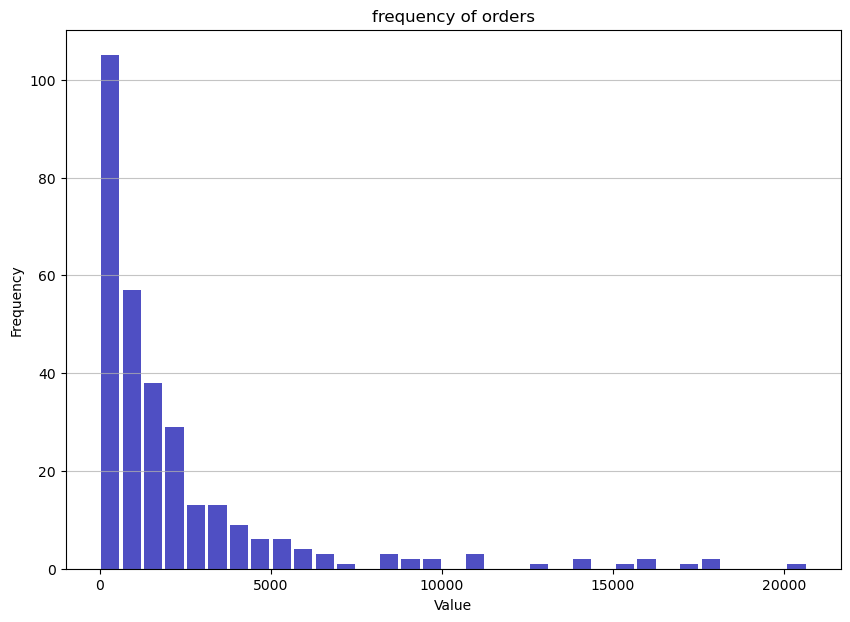

In [267]:
graphLifts(19)

In [274]:
graphLifts(13)

POINT@:
[0, 1, 5]
[([1, 2, 1], [2, 1, 1], 0, 1), ([1, 2, 1], [1, 1, 1], 0, 1), ([1, 0, 8], [0, 1, 8], 0, 1), ([1, 0, 8], [11, 1, 8], 0, 1), ([1, 5, 2], [5, 1, 2], 0, 1), ([1, 5, 2], [1, 1, 2], 0, 1), ([1, 1, 2], [5, 1, 2], 0, 1), ([1, 1, 2], [1, 1, 2], 0, 1), ([1, 11, 8], [0, 1, 8], 0, 1), ([1, 11, 8], [11, 1, 8], 0, 1), ([1, 1, 1], [2, 1, 1], 0, 1), ([1, 1, 1], [1, 1, 1], 0, 1)]
point1, point2 in find formula
[1, 1, 1] [1, 2, 1]
ORBITS of[1, 1, 1]
[[1, 1, 1], [1, 1, 2], [1, 2, 5], [1, 5, 0], [1, 0, 8], [1, 8, 11], [1, 11, 12], [1, 12, 12], [1, 12, 11], [1, 11, 8], [1, 8, 0], [1, 0, 5], [1, 5, 2], [1, 2, 1]]
point1, point2 in find formula
[1, 2, 1] [2, 1, 1]
ORBITS of[1, 2, 1]
[[1, 2, 1], [2, 5, 1], [5, 0, 1], [0, 8, 1], [8, 11, 1], [11, 12, 1], [12, 12, 1], [12, 11, 1], [11, 8, 1], [8, 0, 1], [0, 5, 1], [5, 2, 1], [2, 1, 1], [1, 1, 1]]
point1, point2 in find formula
[2, 1, 1] [0, 1, 5]
ORBITS of[2, 1, 1]
[[2, 1, 1], [1, 1, 1], [1, 1, 2], [2, 1, 5], [5, 1, 0], [0, 1, 8], [8, 1, 11], [1

Exception: two points not in orbit of each other

In [275]:
findOrbit([2, 1, 5], 2, 13)

[[2, 1, 5],
 [1, 0, 5],
 [0, 12, 5],
 [12, 11, 5],
 [11, 10, 5],
 [10, 9, 5],
 [9, 8, 5],
 [8, 7, 5],
 [7, 6, 5],
 [6, 5, 5],
 [5, 4, 5],
 [4, 3, 5],
 [3, 2, 5]]

In [276]:
findOrbit([3, 4, 5], 2, 13)

[[3, 4, 5],
 [4, 5, 5],
 [5, 6, 5],
 [6, 7, 5],
 [7, 8, 5],
 [8, 9, 5],
 [9, 10, 5],
 [10, 11, 5],
 [11, 12, 5],
 [12, 0, 5],
 [0, 1, 5],
 [1, 2, 5],
 [2, 3, 5]]

In [198]:
findCage(19)

[[1, 1, 2],
 [1, 2, 1],
 [1, 2, 5],
 [1, 4, 6],
 [1, 5, 2],
 [1, 6, 4],
 [1, 14, 17],
 [1, 17, 14],
 [1, 17, 18],
 [1, 18, 17],
 [1, 18, 18],
 [2, 1, 1],
 [2, 1, 5],
 [2, 2, 3],
 [2, 2, 9],
 [2, 3, 2],
 [2, 3, 16],
 [2, 5, 1],
 [2, 5, 10],
 [2, 9, 2],
 [2, 9, 14],
 [2, 10, 5],
 [2, 10, 17],
 [2, 14, 9],
 [2, 14, 18],
 [2, 16, 3],
 [2, 16, 17],
 [2, 17, 10],
 [2, 17, 16],
 [2, 18, 14],
 [2, 18, 18],
 [3, 2, 2],
 [3, 2, 16],
 [3, 3, 10],
 [3, 3, 17],
 [3, 8, 9],
 [3, 9, 8],
 [3, 9, 16],
 [3, 10, 3],
 [3, 10, 11],
 [3, 11, 10],
 [3, 16, 2],
 [3, 16, 9],
 [3, 17, 3],
 [3, 17, 17],
 [4, 1, 6],
 [4, 5, 9],
 [4, 5, 13],
 [4, 6, 1],
 [4, 6, 14],
 [4, 8, 9],
 [4, 8, 11],
 [4, 9, 5],
 [4, 9, 8],
 [4, 10, 11],
 [4, 10, 14],
 [4, 11, 8],
 [4, 11, 10],
 [4, 13, 5],
 [4, 13, 18],
 [4, 14, 6],
 [4, 14, 10],
 [4, 18, 13],
 [5, 1, 2],
 [5, 2, 1],
 [5, 2, 10],
 [5, 4, 9],
 [5, 4, 13],
 [5, 6, 18],
 [5, 9, 4],
 [5, 9, 17],
 [5, 10, 2],
 [5, 10, 15],
 [5, 13, 4],
 [5, 15, 10],
 [5, 17, 9],
 [5, 17, 18],
 

In [80]:
C=findCage(19)
if ([1,1, 1] in C ): 
    print (1)
print(C)

[[1, 1, 2], [1, 2, 1], [1, 2, 5], [1, 4, 6], [1, 5, 2], [1, 6, 4], [1, 14, 17], [1, 17, 14], [1, 17, 18], [1, 18, 17], [1, 18, 18], [2, 1, 1], [2, 1, 5], [2, 2, 3], [2, 2, 9], [2, 3, 2], [2, 3, 16], [2, 5, 1], [2, 5, 10], [2, 9, 2], [2, 9, 14], [2, 10, 5], [2, 10, 17], [2, 14, 9], [2, 14, 18], [2, 16, 3], [2, 16, 17], [2, 17, 10], [2, 17, 16], [2, 18, 14], [2, 18, 18], [3, 2, 2], [3, 2, 16], [3, 3, 10], [3, 3, 17], [3, 8, 9], [3, 9, 8], [3, 9, 16], [3, 10, 3], [3, 10, 11], [3, 11, 10], [3, 16, 2], [3, 16, 9], [3, 17, 3], [3, 17, 17], [4, 1, 6], [4, 5, 9], [4, 5, 13], [4, 6, 1], [4, 6, 14], [4, 8, 9], [4, 8, 11], [4, 9, 5], [4, 9, 8], [4, 10, 11], [4, 10, 14], [4, 11, 8], [4, 11, 10], [4, 13, 5], [4, 13, 18], [4, 14, 6], [4, 14, 10], [4, 18, 13], [5, 1, 2], [5, 2, 1], [5, 2, 10], [5, 4, 9], [5, 4, 13], [5, 6, 18], [5, 9, 4], [5, 9, 17], [5, 10, 2], [5, 10, 15], [5, 13, 4], [5, 15, 10], [5, 17, 9], [5, 17, 18], [5, 18, 6], [5, 18, 17], [6, 1, 4], [6, 4, 1], [6, 4, 14], [6, 5, 18], [6, 11

In [102]:
print(maxOrd([1, 2, 1], 11))

12


In [105]:
print(findOrbit([1, 1, 2], 2, 11))

[[1, 1, 2], [1, 5, 2], [5, 7, 2], [7, 4, 2], [4, 6, 2], [6, 10, 2], [10, 10, 2], [10, 6, 2], [6, 4, 2], [4, 7, 2], [7, 5, 2], [5, 1, 2]]


In [ ]:
print(checkTypeIterate([1, 1, 2],19))

In [ ]:
print(checkTypeIterate([5, 1, 2],19))

In [ ]:
print(checkTypeIterate([3, 2, 2],19))

In [ ]:
print(checkTypeIterate([3, 10,11],19))

In [ ]:
findOrbit([1, 1, 2],0, 19)

In [ ]:
findOrbit([1, 1, 2],0, 19)

In [ ]:
findOrbit([5, 1, 2],1, 19)

In [ ]:
findOrbit([17, 1, 18],1, 19)

In [ ]:
findLift([17, 1, 18], 19)

In [ ]:

findLift([17, 14, 10], 19)

In [ ]:
findLift([10, 11, 4], 19)

In [ ]:
findLift([5, 10, 2], 19)

In [ ]:
findLift([14, 4, 10], 19)

In [ ]:
findLift([16, 10, 8], 19)

In [ ]:
findPath([9,17,17],[14, 4, 10], 19)

In [ ]:
findPath([16, 11, 6],[2, 18, 18], 19)

In [ ]:
findPath([6, 1, 4],[13, 14, 18], 19)

In [ ]:
findPath([9, 5, 4],[13, 14, 18], 19)

In [ ]:
findPath([14, 4, 10],[18, 15, 6], 19)

In [ ]:
C = findTriples(19)
print( C)

In [ ]:
print(findOrbit([2, 1, 5], 0, 19))

In [ ]:
print(findPathCrossCage([1, 1, 1], [11, 9, 15], 19))

print(markoffPathFind([6,4, 2], [10,9,1], 11))
#print(findRoutetoCage([1, 1, 1], 19))
#print(maxOrd([1, 1, 1], 19))

In [ ]:
applyPath([6, 4, 2], "R2^2 R1^4 R3^1", 11 )

In [ ]:
applyPath([1, 1, 1], "R3^9 R1^0 R1^6   R1^1", 19 )

# applying the rotations in the integer


In [50]:
def applyIntRotation(Point, Rot): #Rot is in the form of R2^3
    rotSeparated = list(Rot.split("^"))
    
    if ("" in rotSeparated): 
        rotSeparated= remove(rotSeparate, "")
    
    initial= Point
    operation = Rot1
    if rotSeparated[0] == "R2": 
        operation = Rot2
    if rotSeparated[0]== "R3": 
        operation = Rot3
    for i in range(int(rotSeparated[1])): 
        initial = operation(initial[0], initial[1], initial[2])
        
    return initial







def applyPathInt(startPoint, path): # apply the given path to startpoint 
    # separate the path
    pathSeparated = list(path.split(" "))
    if ("" in pathSeparated): 
        pathSeparated= remove(pathSeparated, "")
    print (pathSeparated)
    
    initial = startPoint
    pathSeparated.reverse()
    for ope in pathSeparated: 
      #  print("ope: ")
      #  print(ope)
        initial = applyIntRotation(initial, ope)
      #  print("initial:")
     #   print(initial)
        
    return initial    
       

# find and graph lift given a prime p

In [51]:
# function that finds the size of lifts given a prime.
def findLift(Point, p): 
    #given a point, return the size of its lift
    path = markoffPathFind([1, 1, 1], Point, p)
    intPoint = applyPathInt([1, 1, 1], path)
    return max(intPoint)

In [52]:
#print(findOrbit([4, 7, 2],2, 11))

print(findOrbit([11, 9, 15],1, 19))

[[11, 9, 15], [15, 9, 14], [14, 9, 2], [2, 9, 2], [2, 9, 14], [14, 9, 15], [15, 9, 11], [11, 9, 16], [16, 9, 3], [3, 9, 8], [8, 9, 4], [4, 9, 5], [5, 9, 17], [17, 9, 17], [17, 9, 5], [5, 9, 4], [4, 9, 8], [8, 9, 3], [3, 9, 16], [16, 9, 11]]


In [ ]:
print(findCage(11))

In [ ]:
print(findCage(19))

In [ ]:
print(findTriples(19))

In [ ]:
print(findOrbit([3, 2, 2],0, 19))

In [83]:
findLift([16, 13, 8], 19)

order large than sqrt
path1
 R1^1
['R1^1']
ope: 
R1^1
initial:
[1, 1, 2]
interpoint: 
[1, 1, 2]
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
2
16
[([9, 2, 2], [16, 2, 3], 2, 0), ([16, 17, 2], [16, 17, 2], 2, 0), ([9, 2, 2], [16, 2, 17], 2, 0), ([16, 17, 2], [16, 17, 16], 2, 0), ([2, 9, 2], [16, 9, 11], 2, 0), ([5, 10, 2], [16, 10, 16], 2, 0), ([2, 9, 2], [16, 9, 3], 2, 0), ([5, 10, 2], [16, 10, 8], 2, 0), ([14, 9, 2], [16, 9, 11], 2, 0), ([17, 10, 2], [16, 10, 16], 2, 0), ([14, 9, 2], [16, 9, 3], 2, 0), ([17, 10, 2], [16, 10, 8], 2, 0), ([3, 2, 2], [16, 2, 3], 2, 0), ([10, 17, 2], [16, 17, 2], 2, 0), ([3, 2, 2], [16, 2, 17], 2, 0), ([10, 17, 2], [16, 17, 16], 2, 0)]
point1, point2 in find formula
[1, 1, 2] [9, 2, 2]
point1, point2 in find formula
[9, 2, 2] [16, 2, 3]
point1, point2 in find formula
[16, 2, 3] [16, 13, 8]
['R1^13', 'R2^12', 'R3^13', 'R1^1']
ope: 
R1^1
initial:
[1, 1, 2]
ope: 
R3^13
initial:
[1311738121

1321787265317152388119931679001515711708318704411873927407107367333653323042286539287302507758648078341225038711661726233982890829033286118167142444533379050233553903179709372258289024818304963331931346386557947786471813923763665799513337348600112795316612015202182415090955250989868549341705207048825891785231733018056702175049141661786605843739126498860678827675785222407979381179596464998421929278033085809907848991782167702067503780176798674766521558395887331151472747737654406548676153065262412107696150214023222897086633742729114027150844368810370971486388522270174851797740378120060030182099371953766399631784343945853218938529589770242499481113712315732947421500219810592478448513042431314556111204517311527972639308991582380209872168183685792337096179719666562585808272657563702923340369048145891917603676294316683056029883680235028420298979448650399294226669987934176913164762616946478106564116815982623091864320869732183767781800119999468183352604129115951515347619065589305676033219402406

In [116]:
print(findMaxOrd([6, 18, 15], 19))

print(findMaxOrd([6, 4, 2], 11))
print(findOrbit([6, 4, 2], 2, 11))

[1]
[2]
[[6, 4, 2], [4, 7, 2], [7, 5, 2], [5, 1, 2], [1, 1, 2], [1, 5, 2], [5, 7, 2], [7, 4, 2], [4, 6, 2], [6, 10, 2], [10, 10, 2], [10, 6, 2]]


In [ ]:
print(findPath([6, 4, 2],[10,9,1], 11))

#findPath([1, 6, 9],[7, 9, 7], 11)

print(applyPath([6, 4, 2], 'R2^2 R1^4 R3^1 ', 11 ))

In [ ]:
print(findOrbit([13, 4, 18], 2, 19))

In [ ]:
findPath([13, 5, 4], [14, 4, 6], 19)

In [ ]:
findPath([1, 1, 2], [14, 4, 10], 19)


In [ ]:
print(findOrbit([1, 1, 2],0, 19))
print(findMaxOrd([1, 1, 2], 19))

In [ ]:
print(findPath([9, 16, 3], [9, 16, 11], 19))
print(findOrbit([9,16,3],0, 19))

In [ ]:
cagePath([1, 1, 2], [14, 4, 10], 19)

In [ ]:
cagePath([13, 5, 4], [14, 4, 6], 19)

In [ ]:
print(findOrbit([4, 18, 13], 0, 19))

In [ ]:
print(findCage(19))

In [ ]:
applyPathInt([1, 1, 1], "R2^2 R1^7 R3^6   R1^1" )


applyPathInt([1, 1, 1], "R3^9 R1^0 R1^6   R1^1")

In [ ]:
print([115130507114065318663421682827290968845263352286383689%19,
 1492726288857469632379330%19,
 515575003855971687986189988202082137750941791401286946369859557837616112317453%19])
print([29306416168104163256567950553%19, 53630725573190772220283390950949%19, 610%19])

In [ ]:
print(findOrbit([40, 106, 120], 0, 131))
print(applyRotation ([40,106, 120], "R1^7",131))
print(applyRotation ([40,116, 23], "R1^3",131))
print(findOrder([40, 106, 120],0, 131))
print(Rot1(40,106,120))

In [ ]:
print(Rot1(40, 120, 14294))

In [ ]:
print(Rot1(40, 14294, 1715160))

In [ ]:
print(Rot1(40, 1715160, 205804906))

In [ ]:
reverseRotation([40,106,120], [40,107,25], "R1^4", 131)

In [ ]:
path = "1, 2, 3,   2, 3. 3.    "
pathSeparated = list(path.split(" "))
if ("" in pathSeparated): 
    pathSeparated.remove("")
print(pathSeparated)
if ("" in pathSeparated): 
    pathSeparated.remove("")
print(pathSeparated)

paths = remove(pathSeparated, "")
print( paths)
    

# graph size of lift nodes

In [48]:
def graphLifts(p): 
    data = []
    for triple in findTriples(p):
        data += [math.log(findLift(triple, p), 3)]
    fig, ax = plt.subplots(figsize =(10, 7))
   # xaxis = [k for k in range(p-1)]
    n, bins, patches = plt.hist(x=data, bins='auto', color='#0504aa',
                                alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('frequency of orders')

    return data

In [53]:
graphLifts(11)

NameError: name 'markoffPathFind' is not defined

In [84]:
findCage(11)

[[1, 1, 2],
 [1, 2, 1],
 [1, 2, 5],
 [1, 5, 2],
 [1, 6, 9],
 [1, 9, 6],
 [1, 9, 10],
 [1, 10, 9],
 [1, 10, 10],
 [2, 1, 1],
 [2, 1, 5],
 [2, 4, 6],
 [2, 4, 7],
 [2, 5, 1],
 [2, 5, 7],
 [2, 6, 4],
 [2, 6, 10],
 [2, 7, 4],
 [2, 7, 5],
 [2, 10, 6],
 [2, 10, 10],
 [4, 2, 6],
 [4, 2, 7],
 [4, 4, 9],
 [4, 5, 7],
 [4, 5, 9],
 [4, 6, 2],
 [4, 7, 2],
 [4, 7, 5],
 [4, 9, 4],
 [4, 9, 5],
 [5, 1, 2],
 [5, 2, 1],
 [5, 2, 7],
 [5, 4, 7],
 [5, 4, 9],
 [5, 7, 2],
 [5, 7, 4],
 [5, 9, 4],
 [5, 9, 10],
 [5, 10, 9],
 [6, 1, 9],
 [6, 2, 4],
 [6, 2, 10],
 [6, 4, 2],
 [6, 7, 9],
 [6, 9, 1],
 [6, 9, 7],
 [6, 10, 2],
 [7, 2, 4],
 [7, 2, 5],
 [7, 4, 2],
 [7, 4, 5],
 [7, 5, 2],
 [7, 5, 4],
 [7, 6, 9],
 [7, 7, 9],
 [7, 9, 6],
 [7, 9, 7],
 [9, 1, 6],
 [9, 1, 10],
 [9, 4, 4],
 [9, 4, 5],
 [9, 5, 4],
 [9, 5, 10],
 [9, 6, 1],
 [9, 6, 7],
 [9, 7, 6],
 [9, 7, 7],
 [9, 10, 1],
 [9, 10, 5],
 [10, 1, 9],
 [10, 1, 10],
 [10, 2, 6],
 [10, 2, 10],
 [10, 5, 9],
 [10, 6, 2],
 [10, 9, 1],
 [10, 9, 5],
 [10, 10, 1],
 [10, 10, 2]

In [155]:
#graphLifts(11)

# investigating why there is so few points with order less that sqrt p 

In [ ]:
# phi function 
def findDivisors(a): 
    divisorList = []
    for i in range(int(a/2 + 2)): 
        if a%(i+1) == 0: 
            divisorList += [i+1]
    return divisorList
def coprime(a, b): 
    return -1
def phi(a,b): 
    return -1
    

# orders of poitns in Fp^x

In [ ]:
def findOrderFcross(a, p):
    if a == 0:
        return 0
    for i in range(p): 
        if (a**(i+1)) % p == 1 :
            return i+1
    raise Exception("Order in Fcorss not found")

In [ ]:
findOrderFcross(2, 5)

In [ ]:
def graphOrderFp (p):
    # An "interface" to matplotlib.axes.Axes.hist() method
    d = [findOrderFcross(i, p) for i in range(p)]
    print(d)
   
    fig, ax = plt.subplots(figsize =(10, 7))
    xaxis = [k for k in range(p-1)]
    n, bins, patches = plt.hist(x=d, bins='auto', color='#0504aa',
                                alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('frequency of orders')

    maxfreq = n.max()
    # Set a clean upper y-axis limit.
    plt.ylim(ymax=np.ceil(maxfreq / 10) * 10 if maxfreq % 10 else maxfreq + 10)


In [ ]:
graphOrderFp(37)

# find table of orders of points


In [ ]:
from tabulate import tabulate
def OrderTable(p): 
    allTriples = findTriples(p)
    dataSet = []
    col_names = ["point", "x1", "x2", "x3"]
    for Triple in allTriples: 
        dataSet.append([Triple, findOrder(Triple, 0, p), findOrder(Triple, 1, p), findOrder(Triple, 2, p)])
    
    print(tabulate(dataSet, headers=col_names, tablefmt="fancy_grid"))

In [ ]:
OrderTable(11)